# Предсказание виновника ДТП

## Общая постановка задачи

Для каршеринговой компании требуется создать систему предсказания виновника ДТП. 

Идея создания такой системы находится в стадии предварительного обсуждения и проработки (PoC). Задача — понять, возможно ли предсказывать виновность в ДТП, опираясь на исторические данные.

*Идея решения задачи:*

- Создать модель предсказания виновности ДТП (целевое значение — `at_fault` (виновник) в таблице `parties`, тип виновника - машина `car`.
- Выбрать случаи, когда ДТП привело к любым повреждениям транспортного средства, кроме типа `scratch` (царапина).
- Для моделирования ограничиться данными за `2012` год — они самые свежие.
- `Обязательное` условие — учесть `фактор возраста` автомобиля.
- На основе модели исследовать основные факторы ДТП.
- Понять, помогут ли результаты моделирования и анализ важности факторов ответить на вопросы:
 - Возможно ли создать адекватную системы оценки водительского риска при выдаче авто?
 - Какие ещё факторы нужно учесть?

**ER диаграмма**

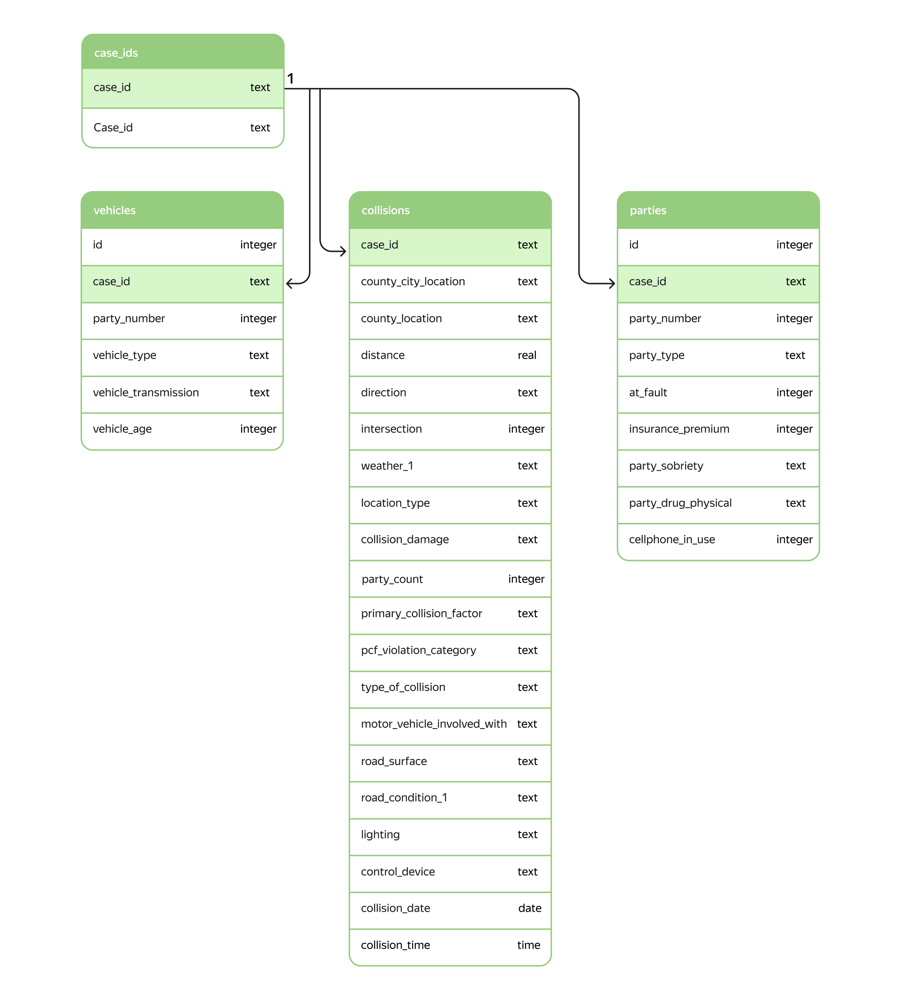

## Импорт библиотек

In [243]:
import warnings

import random
from math import ceil

from sqlalchemy import create_engine

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns

from sklearn.model_selection import train_test_split, KFold, cross_validate, GridSearchCV
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.metrics import roc_auc_score, f1_score, accuracy_score, precision_score, recall_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, roc_curve
import optuna

from catboost import Pool, cv, CatBoostClassifier
import lightgbm as lgb
from lightgbm import LGBMClassifier

import torch 
import torch.nn as nn

from skorch import NeuralNetClassifier

In [2]:
warnings.filterwarnings('ignore')
pd.set_option('display.float_format', '{:.4f}'.format)
pd.set_option('display.max_columns', 40)
sns.set_theme(style='darkgrid')
RND_ST = 42
N_FOLDS = 5
TIME_FORMAT = '%H:%M:%S'
TST_SZE = .2

## Подключение к БД

In [3]:
db_config = {'user': 'user', 
             'pwd':  'password',
             'host': 'host',
             'port':  0,
             'db':   'db_name'
}  

connection_string = 'postgresql://{}:{}@{}:{}/{}'.format(
    db_config['user'],
    db_config['pwd'],
    db_config['host'],
    db_config['port'],
    db_config['db'])

In [4]:
engine = create_engine(connection_string)

In [5]:
def showsql(query, return_df=False):
    '''Функция выводит на экран или сохраняет в переменную результат sql запроса'''
    
    task = pd.read_sql_query(query, con=engine)
    if return_df:
        return task
    else:
        display(task)

Подключение к БД создано

## Первичное исследование таблиц

Выведем информацию для ответов на вопросы:
1. Все ли таблицы имеют набор данных;
2. Соответствует ли количество таблиц условию задачи;
3. Имеется ли общий ключ для связи таблиц.

Выведем информацию о таблицах схемы `public`:
- название
- размер данных в Мб
- размер индексов в Мб (Индексы в PostgreSQL — специальные объекты базы данных, предназначенные в основном для ускорения доступа к данным)
- итоговый размер в Мб
- кол-во страниц
- оценка кол-ва строк в таблице
- кол-во столбцов в таблице

In [6]:
query_0 = '''
WITH size_part AS(
SELECT table_name,
       pg_size_pretty(table_size) AS table_size,
       pg_size_pretty(indexes_size) AS indexes_size,
       pg_size_pretty(total_size) AS total_size
FROM (
      SELECT table_name,
             pg_table_size(table_name) AS table_size,
             pg_indexes_size(table_name) AS indexes_size,
             pg_total_relation_size(table_name) AS total_size
      FROM (
            SELECT table_name
            FROM information_schema.tables
            WHERE table_schema IN ('public')
           ) AS t_name
      ) AS t_name_size
),

page_part AS (
SELECT relname,
       relpages,
       reltuples
FROM pg_class
WHERE relname IN ('collisions', 'parties', 'vehicles', 'case_ids')
),

columns_part AS(
SELECT table_name,
       COUNT(column_name) AS columns_qty
FROM information_schema.columns
WHERE table_schema = 'public'
GROUP BY table_name)

SELECT s.table_name,
       table_size,
       indexes_size,
       total_size,
       relpages AS pages_qty,
       reltuples AS rows_qty,
       columns_qty
FROM size_part AS s
JOIN page_part AS p ON s.table_name=p.relname
JOIN columns_part AS c ON c.table_name=s.table_name
'''
showsql(query_0)

,table_name,table_size,indexes_size,total_size,pages_qty,rows_qty,columns_qty
0,collisions,302 MB,0 bytes,302 MB,38644,1387880.0000,20
1,parties,246 MB,59 MB,305 MB,31467,2752410.0000,9
2,vehicles,63 MB,22 MB,85 MB,8029,1021230.0000,6
3,case_ids,59 MB,30 MB,89 MB,7568,1400000.0000,2


In [7]:
query_columns = '''
SELECT table_name,
       column_name,
       data_type 
FROM INFORMATION_SCHEMA.COLUMNS 
WHERE table_name = '''

In [8]:
for col in ("'collisions'", "'parties'", "'vehicles'", "'case_ids'"):
    query_res = query_columns + str(col)
    showsql(query_res)

,table_name,column_name,data_type
0,collisions,case_id,text
1,collisions,county_city_location,text
2,collisions,county_location,text
3,collisions,distance,real
4,collisions,direction,text
5,collisions,intersection,integer
6,collisions,weather_1,text
7,collisions,location_type,text
8,collisions,collision_damage,text
9,collisions,party_count,integer


,table_name,column_name,data_type
0,parties,id,integer
1,parties,case_id,text
2,parties,party_number,integer
3,parties,party_type,text
4,parties,at_fault,integer
5,parties,insurance_premium,integer
6,parties,party_sobriety,text
7,parties,party_drug_physical,text
8,parties,cellphone_in_use,integer


,table_name,column_name,data_type
0,vehicles,id,integer
1,vehicles,case_id,text
2,vehicles,party_number,integer
3,vehicles,vehicle_type,text
4,vehicles,vehicle_transmission,text
5,vehicles,vehicle_age,integer


,table_name,column_name,data_type
0,case_ids,case_id,text
1,case_ids,db_year,text


1. Все таблицы содержат данные
| Таблица | Размер, Мб | Строки | Столбцы |
| :- | :-: | :-: | :-: |
| collisions | 302  | 1 387 880 | 20 |
| parties | 246  | 2 752 410 | 9 |
| vehicles | 63  | 1 021 230 | 6 |
| case_ids | 59  | 1 400 000 | 2 |

2. Кол-во таблиц соответствует условию задачи
3. У всех таблиц есть общий ключ - поле `case_id`, тип данных `text`. Таблицы `parties` и `vehicles` дополнительно имеют поле `party_number`, тип данных `integer`, которое в связке с полем `case_id` позволяет объединить всех участников одного ДТП (уникального `case_id`)

#  Cтатистический анализ факторов ДТП

В какие месяцы происходит наибольшее количество аварий. Проанализируем весь период наблюдений.

In [9]:
query_collisions_by_month = '''
WITH tmp AS (
SELECT EXTRACT('month' FROM collision_date) AS n_month,
       COUNT(case_id) AS collisions_qty
FROM collisions
GROUP BY EXTRACT('month' FROM collision_date)
ORDER BY n_month ASC
)

SELECT to_char(to_timestamp(n_month::text, 'MM'), 'Month') AS month,
       collisions_qty
FROM tmp
'''
df_collisions_by_month = showsql(query_collisions_by_month, True)

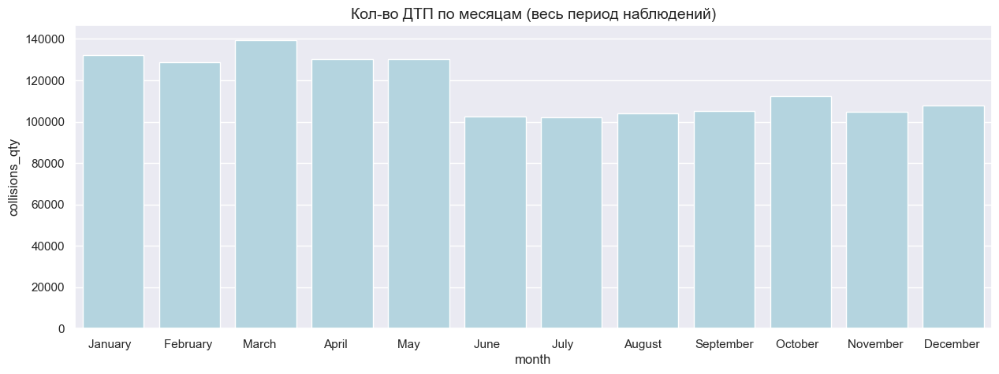

In [10]:
f, ax = plt.subplots(figsize=(15, 5))
sns.barplot(x='month',
            y='collisions_qty',
            data=df_collisions_by_month,
            color='lightblue')
ax.set_title('Кол-во ДТП по месяцам (весь период наблюдений)', fontsize=14)
plt.show()

Максимальное кол-во ДТП регистрируется в зимние (кроме декабря) и весенние месяцы (вероятно, сказывается состояние дорог в этот период), минимальное - в летние месяцы, очень небольшой рост наблюдается в осенние месяцы (по сравнению с летом).

Кол-во ДТП и кол-во месяцев в статистике с разбивкой по годам:

In [11]:
query_collisions_monthsInside_by_year = '''
SELECT EXTRACT('Year' FROM collision_date) AS collision_year,
       COUNT(DISTINCT(EXTRACT('Month' FROM collision_date))) AS month_qty,
       COUNT(case_id) AS collisions_qty
FROM collisions
GROUP BY EXTRACT('Year' FROM collision_date)
ORDER by collision_year
'''
showsql(query_collisions_monthsInside_by_year)

,collision_year,month_qty,collisions_qty
0,2009.0000,12,426228
1,2010.0000,12,416490
2,2011.0000,12,402428
3,2012.0000,12,154547
4,2013.0000,6,305
5,2020.0000,2,2


Как видим данные неравномерны. С 2009 по 2012 данные присутствуют за 12 месяцев, за 2013 и 2020 годы данных крайне мало и только за 6 и 2 месяца соответственно. При этом кол-во зарегистрированных ДТП за 2009 - 2011 годы находится примерно на одной отметке (400+ тыс случаев), а в 2012 году кол-во зарегистрированных ДТП резко снижается в 2.6 раза.

Выведем графики кол-ва ДТП по месяцам с разбивкой по годам для периода 2009 - 2012:

In [12]:
query_collisions_by_month_yearSplit = '''
WITH tmp AS (
SELECT EXTRACT('year' FROM collision_date) AS year,
       EXTRACT('month' FROM collision_date) AS n_month,
       COUNT(case_id) AS collisions_qty
FROM collisions
WHERE EXTRACT('year' FROM collision_date) < 2013
GROUP BY EXTRACT('year' FROM collision_date), EXTRACT('month' FROM collision_date)
)

SELECT year::numeric::integer,
       to_char(to_timestamp(n_month::text, 'MM'), 'Month') AS month,
       collisions_qty
FROM tmp
'''
df_collisions_by_month_yearSplit = showsql(query_collisions_by_month_yearSplit, True)

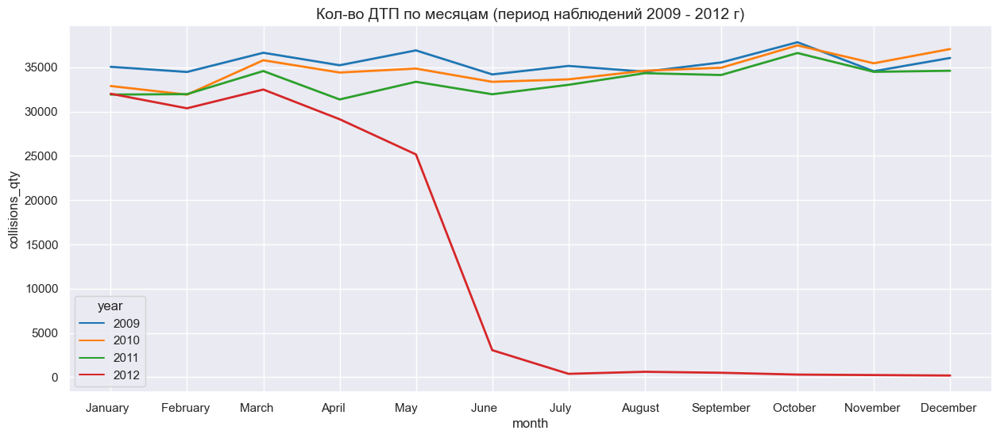

In [13]:
f, ax = plt.subplots(figsize=(15, 6))
sns.lineplot(x='month',
             y='collisions_qty',
             hue='year',
             data=df_collisions_by_month_yearSplit,
             palette='tab10', linewidth=2)
ax.set_title('Кол-во ДТП по месяцам (период наблюдений 2009 - 2012 г)', fontsize=14)
plt.show()

Очень сильное отличие в данных за 2012 год. До Апреля включительно картина очень напоминает данные за предыдущие года, но начиная с Мая и до Июня идет резкое снижение числа зарегистрированных ДТП и далее - стабилизация практически на околонулевой отметке.

Выведем данные за 2012 по кол-ву ДТП с разбивкой по месяцам в цифрах:

In [14]:
query_collisions_by_month_2012 = '''
WITH tmp AS (
SELECT EXTRACT('month' FROM collision_date) AS n_month,
       COUNT(case_id) AS collisions_qty
FROM collisions
WHERE EXTRACT('year' FROM collision_date) = 2012
GROUP BY EXTRACT('month' FROM collision_date)
ORDER BY n_month ASC
)

SELECT to_char(to_timestamp(n_month::text, 'MM'), 'Month') AS month_2012,
       collisions_qty
FROM tmp
'''
showsql(query_collisions_by_month_2012)

,month_2012,collisions_qty
0,January,32020
1,February,30377
2,March,32498
3,April,29143
4,May,25168
5,June,3062
6,July,390
7,August,622
8,September,510
9,October,304


### Аналитические задачи

#### Задача 1

Для каждого из населенных пунктов `COUNTY_LOCATION` исследовать данные `за 2012 год` на предмет зависимости между виновностью водителя в ДТП и признаком `DIRECTION`. 

**P.S.** Поскольку поле `DIRECTION` находится в таблице `collisions`, то оно означает скорее не направление движения кого-то из участников (иначе это поле было бы в таблице `parties`), а скорее-всего район населенного пункта.

1. Создаем SQL запрос для выгрузки необходимых данных, сохраняем данные в переменную

In [15]:
# делаем RIGHT JOIN с таблицей vehicles чтоб в статистику попали только автомобили 
# не столбы, знаки и т.п.

query_fault_prob_by_place_by_direction = '''
WITH car_fault AS(
SELECT DISTINCT c.county_location,
       c.direction,
       COUNT(c.case_id) OVER(PARTITION BY c.county_location, c.direction) AS car_fault_qty
FROM collisions AS c
JOIN parties AS p ON c.case_id=p.case_id
RIGHT JOIN vehicles AS v ON (v.case_id=p.case_id AND v.party_number=p.party_number)
WHERE (EXTRACT('year' FROM c.collision_date) = 2012) AND (p.at_fault=1)
),

total AS(
SELECT DISTINCT county_location,
       direction,
       COUNT(case_id) OVER(PARTITION BY county_location) AS total_qty
FROM collisions
WHERE (EXTRACT('year' FROM collision_date) = 2012) AND (direction IS NOT NULL)
)

SELECT cf.county_location,
       cf.direction,
       cf.car_fault_qty,
       t.total_qty,
       (cf.car_fault_qty::real/t.total_qty::real*100) AS percent
FROM car_fault AS cf
JOIN total AS t ON (cf.county_location=t.county_location AND cf.direction=t.direction)
ORDER BY cf.county_location, cf.direction
'''
df_1 = showsql(query_fault_prob_by_place_by_direction, True)

In [16]:
df_1

,county_location,direction,car_fault_qty,total_qty,percent
0,alameda,east,322,4757,6.7690
1,alameda,north,328,4757,6.8951
2,alameda,south,304,4757,6.3906
3,alameda,west,310,4757,6.5167
4,alpine,east,7,28,25.0000
...,...,...,...,...,...
226,yolo,west,62,556,11.1511
227,yuba,east,19,207,9.1787
228,yuba,north,23,207,11.1111
229,yuba,south,21,207,10.1449


2. Строим график

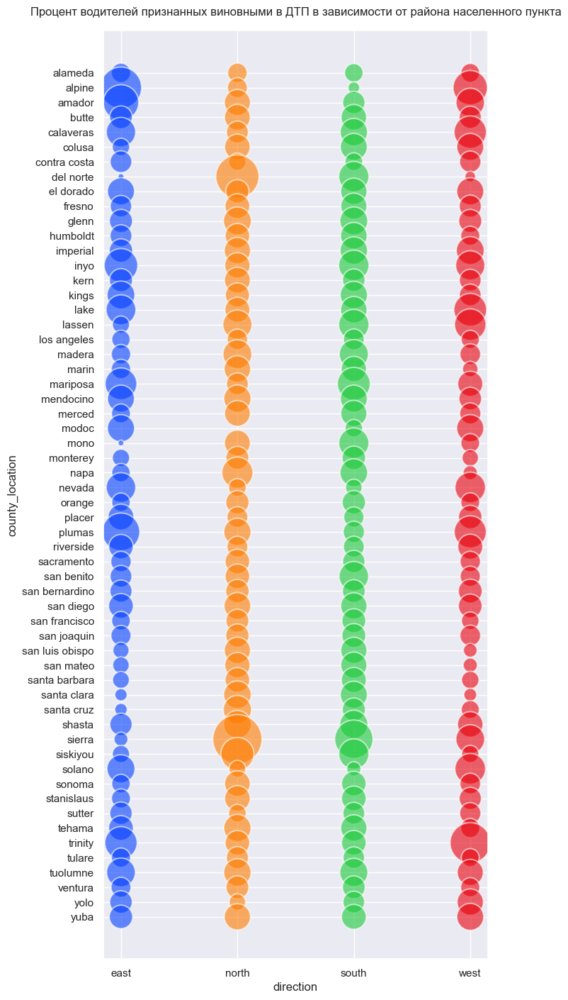

In [17]:
fig, ax = plt.subplots(figsize=(7, 17))
sns.scatterplot(data=df_1,
                x='direction',
                y='county_location',
                hue='direction',
                size='percent',
                sizes=(35, 2500),
                alpha=.6, 
                palette='bright',
                ax=ax,
                legend=False)
ax.tick_params(axis='x')
ax.set_title(
    'Процент водителей признанных виновными в ДТП в зависимости от района населенного пункта',
    fontsize=12,
    y=1.01)
plt.show()

3. Вывод

Для некоторых населенных пунктов (например: `alpine`, `del norte`, `mono`, `sierra`) довольно значительный процент признанных виновными в ДТП находились в определенном районе. И наоборот - есть районы, в которых в данном населенном пункте, водители очень редко признавались виновными в ДТП.

#### Задача 2

Исследовать зависимость признания водителя виновным в ДТП от категории нарушения `PCF_VIOLATION_CATEGORY` и типа кузова `VEHICLE_TYPE`. Данные `за 2012 год`.

1. Создаем SQL запрос для выгрузки необходимых данных, сохраняем данные в переменную

In [18]:
# делаем RIGHT JOIN с таблицей vehicles чтоб в статистику попали только автомобили (не столбы, знаки и т.п.)

query_fault_by_violation_by_vtype = '''
WITH prep AS (
SELECT DISTINCT c.pcf_violation_category,
       v.vehicle_type,
       COUNT(c.case_id) OVER(PARTITION BY c.pcf_violation_category, v.vehicle_type) AS qty_per_vehicle_type,
       COUNT(c.case_id) OVER(PARTITION BY c.pcf_violation_category) AS qty_per_violation_type
FROM collisions AS c
JOIN parties AS p ON c.case_id=p.case_id
RIGHT JOIN vehicles AS v ON (v.case_id=p.case_id AND v.party_number=p.party_number)
WHERE EXTRACT('year' FROM c.collision_date) = 2012 AND (p.at_fault=1) AND (c.pcf_violation_category IS NOT NULL)
)

SELECT pcf_violation_category,
       vehicle_type,
       qty_per_vehicle_type,
       qty_per_violation_type,
       qty_per_vehicle_type::real/qty_per_violation_type::real*100 AS fault_percent
FROM prep
'''
df_2 = showsql(query_fault_by_violation_by_vtype, True)

In [19]:
df_2

,pcf_violation_category,vehicle_type,qty_per_vehicle_type,qty_per_violation_type,fault_percent
0,automobile right of way,coupe,3174,6815,46.5737
1,automobile right of way,hatchback,3,6815,0.0440
2,automobile right of way,minivan,428,6815,6.2803
3,automobile right of way,other,5,6815,0.0734
4,automobile right of way,sedan,3205,6815,47.0286
...,...,...,...,...,...
76,unsafe starting or backing,sedan,778,952,81.7227
77,wrong side of road,coupe,651,2047,31.8026
78,wrong side of road,hatchback,1,2047,0.0489
79,wrong side of road,minivan,1085,2047,53.0044


2. Строим графики

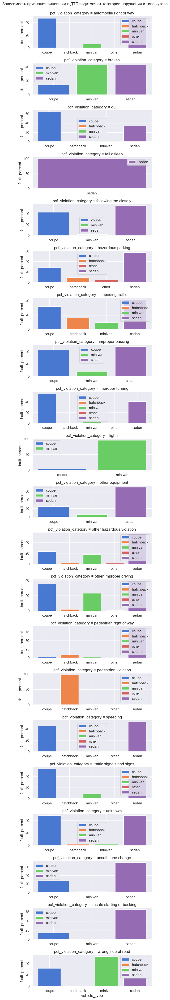

In [20]:
grid = sns.FacetGrid(df_2,
                     row='pcf_violation_category',
                     hue='vehicle_type',
                     sharex=False,
                     sharey=False,
                     palette='muted',
                     height=2,
                     aspect=3)

grid.map(plt.bar, 'vehicle_type', 'fault_percent', label='vehicle_type')
grid.fig.suptitle(
    'Зависимость признания виновным в ДТП водителя от категории нарушения и типа кузова',
    y = 1.005,
    fontsize = 12);

for ax in grid.axes[:, 0]:
    ax.legend()

3. Вывод

Зависимость виновности водителя в ДТП от типа нарушения и типа кузова наблюдается.

#### Задача 3

Исследовть частоту ДТП, произошедших по вине водителя, по типам ущерба `COLLISION_DAMAGE` в зависимости от погоды `WEATHER_1` и времени суток

1. Создаем SQL запрос для выгрузки необходимых данных, сохраняем данные в переменную

In [21]:
# делаем RIGHT JOIN с таблицей vehicles чтоб в статистику попали только автомобили
# не столбы, знаки и т.п.

query_damage_by_time_by_weather = '''
WITH tmp AS(
SELECT EXTRACT('hour' FROM c.collision_time)::integer AS hour_of_day,
       c.collision_damage,
       c.weather_1,
       c.case_id
FROM collisions AS c
JOIN parties AS p ON c.case_id=p.case_id
RIGHT JOIN vehicles AS v ON (v.case_id=p.case_id AND v.party_number=p.party_number)
WHERE (c.collision_damage NOT IN ('scratch'))
  AND (EXTRACT('year' FROM c.collision_date) = 2012)
  AND (p.at_fault=1)
),

prepared AS (
SELECT DISTINCT hour_of_day,
       weather_1 AS weather,
       collision_damage,
       COUNT(case_id) OVER(PARTITION BY hour_of_day, weather_1, collision_damage) AS damage_type_qty,
       COUNT(case_id) OVER(PARTITION BY hour_of_day) AS total_qty
FROM tmp
WHERE (weather_1 IS NOT NULL) AND (hour_of_day IS NOT NULL)
ORDER BY hour_of_day, weather, collision_damage ASC
)

SELECT hour_of_day,
       weather,
       collision_damage,
       damage_type_qty,
       total_qty,
       (damage_type_qty::real/total_qty::real*100) AS percent
FROM prepared
'''
df_3 = showsql(query_damage_by_time_by_weather, True)

In [22]:
df_3

,hour_of_day,weather,collision_damage,damage_type_qty,total_qty,percent
0,0,clear,fatal,77,748,10.2941
1,0,clear,middle damage,263,748,35.1604
2,0,clear,severe damage,65,748,8.6898
3,0,clear,small damage,194,748,25.9358
4,0,cloudy,fatal,15,748,2.0053
...,...,...,...,...,...,...
398,23,raining,middle damage,20,917,2.1810
399,23,raining,severe damage,5,917,0.5453
400,23,raining,small damage,22,917,2.3991
401,23,snowing,middle damage,1,917,0.1091


2. Строим график

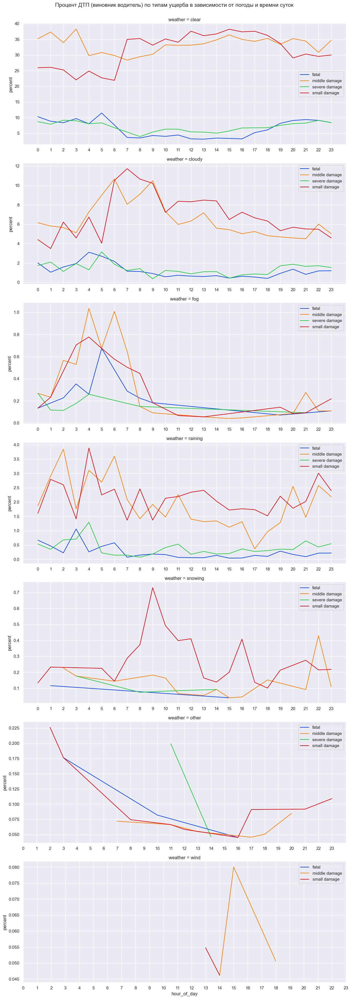

In [23]:
grid = sns.FacetGrid(df_3,
                     row='weather',
                     hue='collision_damage',
                     sharex=False,
                     sharey=False,
                     palette='bright',
                     height=5,
                     aspect=2.5)

grid.map(plt.plot,
         'hour_of_day',
         'percent',
         label='collision_damage')
grid.fig.suptitle(
    'Процент ДТП (виновник водитель) по типам ущерба в зависимости от погоды и времни суток',
    y = 1.01,
    fontsize = 14);

for ax in grid.axes[:, 0]:
    ax.legend()
    ax.set_xticks(range(0, 24, 1))

3. Вывод

По графикам можно отследить периоды максимального кол-ва ДТП с определенными последствиями по времени дня в зависимости от погоды.

#### Задача 4

Выявить наличие несогласованности данных в таблицах `parties` и `vehicles`

1. Создаем SQL запрос, сохраняем данные в переменную

На этапе выполнения предыдущих задач выявлен факт того, что не согласуется тип участника `party_type` в таблицах `parties` и `vehicles` в связке с полем порядкового номера участника `party_number`. Таким образом при выборе в таблице `parties` условия `party_type='car'` мы на самом деле выкидываем почти 97 тыс.!!! участников, которые **являются** автомобилями. Запрос ниже выводит несоответствия между данными в таблицах `parties` и  `vehicles` в поле `party_type` , соответствующие данному ДТП `case_id` и порядковому номеру участника `party_number` 

In [24]:
query_parties_vehicles_bugs = '''
SELECT p.case_id::integer AS p_case_id,
       v.case_id::integer AS v_case_id,
       p.party_number::integer AS p_party_number,
       v.party_number::integer AS v_party_number,
       p.party_type AS p_party_type,
       v.vehicle_type   
FROM parties AS p
RIGHT JOIN vehicles AS v ON (p.case_id=v.case_id AND p.party_number=v.party_number)
WHERE p.party_type NOT IN ('car')
'''
df_pv_bugs = showsql(query_parties_vehicles_bugs, True)

In [25]:
df_pv_bugs

,p_case_id,v_case_id,p_party_number,v_party_number,p_party_type,vehicle_type
0,4008278,4008278,2,2,road signs,hatchback
1,3984319,3984319,1,1,road signs,hatchback
2,4033886,4033886,2,2,building,minivan
3,4036066,4036066,1,1,building,minivan
4,4036331,4036331,2,2,road signs,hatchback
...,...,...,...,...,...,...
96787,4481858,4481858,2,2,road signs,hatchback
96788,4482502,4482502,1,1,road signs,hatchback
96789,4482522,4482522,2,2,building,minivan
96790,4482597,4482597,1,1,building,minivan


2. Делаем вывод

Поле `party_type` из таблицы `parties` нельзя использовать для фильтрации типа участника "автомобиль". Для этого необходимо синхронизироваться с таблицей `vehicles`, в которой содержатся только данные по автомобилям.

## Выгрузка данных

Выбираем:
- тип виновника только машина (делаем `RIGHT JOIN` с таблицей `vehicles`).
- все типы повреждений, кроме `SCRATCH` (царапина).
- данные за `2012` год.
- подготовка исходной таблицы проводится с помощью sql-запроса.
- В задании от заказчика есть **обязательное условие** — учесть `фактор возраста` автомобиля `vehicle_age`. Записи, в которых есть пропуски в этом столбце придется исключить.

In [26]:
# полный список полей указан, чтоб исключить появление дублей названий столбцов
# поля id из таблиц parties и vehicles не нужны
# после case_id взято только из таблицы collisions

query_df_for_model = '''
SELECT c.case_id::integer,
       c.party_count::integer,
       p.party_number::integer AS p_party_number,
       v.party_number::integer AS v_party_number,
       p.party_type,
       v.vehicle_type,
       p.at_fault,
       v.vehicle_transmission,
       v.vehicle_age,
       c.county_city_location,
       c.county_location,
       c.distance,
       c.direction,
       c.intersection,
       c.weather_1,
       c.location_type,
       c.collision_damage,
       c.primary_collision_factor,
       c.pcf_violation_category,
       c.type_of_collision,
       c.motor_vehicle_involved_with,
       c.road_surface,
       c.road_condition_1,
       c.lighting,
       c.control_device,
       to_char(c.collision_date, 'day') AS day_of_week,
       c.collision_date,
       EXTRACT(hour FROM c.collision_time) AS hour,
       c.collision_time,
       p.insurance_premium,
       p.party_sobriety,
       p.party_drug_physical,
       p.cellphone_in_use
FROM collisions AS c
JOIN parties AS p ON c.case_id=p.case_id
RIGHT JOIN vehicles AS v ON (c.case_id=v.case_id AND p.party_number=v.party_number)
WHERE (EXTRACT('year' FROM c.collision_date) = 2012)
  AND (c.collision_damage NOT IN ('scratch'))
  AND (v.vehicle_age IS NOT NULL)
'''
df_raw = showsql(query_df_for_model, True)

Поскольку SQL запрос возвращает записи в произвольном порядке, то для воспроизводимости результатов на следующих этапах проекта стабилизируем датасет, упорядочив его по полям `collision_date`, `collision_time`, `vehicle_type`, `vehicle_age`

In [27]:
df_raw = df_raw.sort_values(by=['collision_date',
                                'collision_time',
                                'vehicle_type',
                                'vehicle_age']).reset_index(drop=True)

In [28]:
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61322 entries, 0 to 61321
Data columns (total 33 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   case_id                      61322 non-null  int64  
 1   party_count                  61322 non-null  int64  
 2   p_party_number               61322 non-null  int64  
 3   v_party_number               61322 non-null  int64  
 4   party_type                   61270 non-null  object 
 5   vehicle_type                 61322 non-null  object 
 6   at_fault                     61322 non-null  int64  
 7   vehicle_transmission         60548 non-null  object 
 8   vehicle_age                  61322 non-null  int64  
 9   county_city_location         61322 non-null  object 
 10  county_location              61322 non-null  object 
 11  distance                     61322 non-null  float64
 12  direction                    46682 non-null  object 
 13  intersection    

In [29]:
df_raw.sample(3, random_state=RND_ST)

,case_id,party_count,p_party_number,v_party_number,party_type,vehicle_type,at_fault,vehicle_transmission,vehicle_age,county_city_location,county_location,distance,direction,intersection,weather_1,location_type,collision_damage,primary_collision_factor,pcf_violation_category,type_of_collision,motor_vehicle_involved_with,road_surface,road_condition_1,lighting,control_device,day_of_week,collision_date,hour,collision_time,insurance_premium,party_sobriety,party_drug_physical,cellphone_in_use
57666,5663017,2,2,2,car,sedan,0,manual,3,3700,san diego,528.0000,west,0.0000,clear,highway,middle damage,vehicle code violation,dui,sideswipe,other motor vehicle,dry,normal,dark with no street lights,none,thursday,2012-05-31,22.0000,22:05:00,44.0000,had not been drinking,None,0.0000
38750,5547771,2,2,2,car,sedan,0,manual,0,5607,ventura,80.0000,south,0.0000,clear,None,small damage,vehicle code violation,speeding,sideswipe,other motor vehicle,dry,normal,daylight,functioning,monday,2012-04-09,11.0000,11:15:00,33.0000,had not been drinking,None,0.0000
2095,5503631,2,1,1,car,sedan,1,auto,1,1964,los angeles,50.0000,south,0.0000,clear,highway,small damage,vehicle code violation,speeding,rear end,other motor vehicle,dry,normal,dark with street lights,none,friday,2012-01-06,20.0000,20:45:00,34.0000,had not been drinking,None,0.0000


Выведем кол-во несоответствий в поле `party_type` значению `car`

In [30]:
df_raw[df_raw['party_type'] != 'car'].shape[0]

6768

... несколько примеров:

In [31]:
df_raw[df_raw['party_type'] != 'car'].sample(5, random_state=RND_ST)

,case_id,party_count,p_party_number,v_party_number,party_type,vehicle_type,at_fault,vehicle_transmission,vehicle_age,county_city_location,county_location,distance,direction,intersection,weather_1,location_type,collision_damage,primary_collision_factor,pcf_violation_category,type_of_collision,motor_vehicle_involved_with,road_surface,road_condition_1,lighting,control_device,day_of_week,collision_date,hour,collision_time,insurance_premium,party_sobriety,party_drug_physical,cellphone_in_use
3730,5483496,2,1,1,building,minivan,1,manual,2,0109,alameda,0.0000,None,1.0000,clear,None,middle damage,vehicle code violation,traffic signals and signs,other,bicycle,dry,normal,dusk or dawn,functioning,wednesday,2012-01-11,8.0000,08:21:00,13.0000,had not been drinking,None,NaN
60106,5638457,2,2,2,road signs,hatchback,0,manual,3,3308,riverside,0.0000,None,1.0000,clear,highway,fatal,vehicle code violation,speeding,other,other object,dry,normal,dark with street lights,functioning,tuesday,2012-09-11,2.0000,02:37:00,23.0000,"had been drinking, under influence",None,1.0000
1765,5403122,2,2,2,building,minivan,0,manual,10,5002,stanislaus,0.0000,None,1.0000,clear,None,fatal,unknown,unknown,broadside,bicycle,dry,normal,dusk or dawn,functioning,friday,2012-01-06,6.0000,06:43:00,67.0000,impairment unknown,G,0.0000
40456,5588410,2,2,2,road signs,hatchback,1,auto,1,1942,los angeles,600.0000,south,0.0000,cloudy,None,middle damage,vehicle code violation,pedestrian violation,other,other object,wet,normal,dusk or dawn,none,friday,2012-04-13,19.0000,19:05:00,7.0000,had not been drinking,None,0.0000
4296,5506465,2,1,1,road signs,hatchback,1,manual,1,0113,alameda,252.0000,east,0.0000,clear,None,severe damage,vehicle code violation,pedestrian violation,broadside,other object,dry,normal,daylight,none,thursday,2012-01-12,16.0000,16:30:00,7.0000,had not been drinking,None,NaN


Смотрим кол-во пропусков по столбцам:

In [32]:
print(df_raw.isna().sum())
print('\nОбщее кол-во пропусков:', df_raw.isna().sum().sum())

case_id                            0
party_count                        0
p_party_number                     0
v_party_number                     0
party_type                        52
vehicle_type                       0
at_fault                           0
vehicle_transmission             774
vehicle_age                        0
county_city_location               0
county_location                    0
distance                           0
direction                      14640
intersection                     223
weather_1                        195
location_type                  35016
collision_damage                   0
primary_collision_factor         162
pcf_violation_category           971
type_of_collision                345
motor_vehicle_involved_with      223
road_surface                     392
road_condition_1                 291
lighting                         192
control_device                   245
day_of_week                        0
collision_date                     0
h

Приводим все строки к нижнему регистру:

In [33]:
for item in df_raw.columns:
    try:
        df_raw[item] = df_raw[item].str.lower()
    except:
        pass

Проверим дубликаты:

In [34]:
df_raw.duplicated().sum()

0

Балланс классов

In [35]:
(
    df_raw['at_fault'].value_counts().to_frame()
    .assign(percent = lambda x: round(x / x['at_fault'].sum()*100, 1) )
)

,at_fault,percent
0,30783,50.2000
1,30539,49.8000


Данные загружены с использованием SQL запроса, сохранены в переменную `df_raw`.

- Датасет содержит **61322** строки, **33** столбца. 
- Типы данных `float64(5)`, `int64(6)`, `object(22)`.
- В данных есть пропуски, общее кол-во пропусков **119 825**.
- Проверены дубликаты (отсутствуют)
- Проверен балланс классов (`0` / `1` - 50.2% / 49.8%).

## Первичный отбор факторов, необходимых для модели

Логика бизнесс задачи требует отбирать только факторы, которые известны непосредственно сразу после ДТП. Признаки, которые могут быть известны уже после проведения тщательного расследования, лучше отклонить.

- <font color='red'>**case_id**</font> это синтетический номер, присвоенный ДТП. Информацию он не содержит (можно, например, нумеровать буквами/символами, например A, AA, AA+ и т.п.). **отклоняем**.
- <font color='red'>**county_city_location**</font> является синонимом признака `county_location`. Для модели лучше использовать категориальные данные, чтоб численное значение не было интерпретировано как больший вес признака. **отклоняем**.
- <font color='lightgreen'>**county_location**</font> признак указывает на географическую точку ДТП.
- <font color='orange'>**distance**</font> признак указывает на расстояние от точки ДТП до главной дороги. Тоже некая географическая характеристика. Нужно смотреть подробнее.
- <font color='red'>**direction**</font>. содержит `14640` пропусков. Невозможно восстановить даже частично, используя данные от других участников одного и того же ДТП. Если оставлять признак, то придется удалять значительное число записей. **отклоняем** 
- <font color='red'>**intersection**</font> Имеет дублирование в виде значения признака `location_type='intersection'`.

In [36]:
# подсчет невосстановимых значений в direction
direction_nan_df = df_raw.groupby('case_id').agg(direction_count=('direction', 'count'))
direction_nan_case_id = direction_nan_df[direction_nan_df["direction_count"]==0].index
print('Число невосстановимых значений в direction',
      df_raw.query('case_id in @direction_nan_case_id').shape[0]
     )

Число невосстановимых значений в direction 14640


In [37]:
# пример, иллюстрирующий связь значений признаков 'intersection' и 'location_type'
df_raw[(df_raw['intersection'] == 1) 
       & (df_raw['location_type'] == 'intersection')][['intersection', 'location_type']][:5]

,intersection,location_type
216,1.0000,intersection
217,1.0000,intersection
238,1.0000,intersection
390,1.0000,intersection
391,1.0000,intersection


- <font color='lightgreen'>**weather_1**</font> признак указывает на погодные условия. Пропусков немного - всего `195`. Восстановить, опираясь на значения для других участников в рамках одного и того же `case_id` даже частично нельзя.

In [38]:
# подсчет невосстановимых значений в weather_1
weather_nan_df = df_raw.groupby('case_id').agg(weather_count=('weather_1', 'count'))
weather_nan_case_id = weather_nan_df[weather_nan_df["weather_count"]==0].index
print('Число невосстановимых значений в weather_1: ',
       df_raw.query('case_id in @weather_nan_case_id').shape[0]
     )

Число невосстановимых значений в weather_1:  195


- <font color='red'>**location_type**</font> содержит `35016` пропусков. Невозможно восстанвоить даже частично, используя данные от других участников одного и того же `case_id`. Если оставлять признак, то придется удалять значительное число записей. **отклоняем**

In [39]:
# подсчет невосстановимых значений в location_type
location_type_nan_df = df_raw.groupby('case_id').agg(location_type_count=('location_type', 'count'))
location_type_nan_case_id = location_type_nan_df[location_type_nan_df["location_type_count"]==0].index
print('Число невосстановимых значений в location_type: ',
       df_raw.query('case_id in @location_type_nan_case_id').shape[0]
     )

Число невосстановимых значений в location_type:  35016


- <font color='red'>**collision_damage**</font> предполагаю, что эти данные известны уже **ПОСЛЕ** установления виновника ДТП. **отклоняем**. 
- <font color='orange'>**party_count**</font> число участников будет одинаково для всех участников ДТП, в том числе и для виновника. Однако, признак может корректировать вероятность по формуле 1/N для каждого участника. Пока оставляем, необходимо дополнительное исследование.
- <font color='red'>**pcf_violation_category**</font> предполагаю, что эти данные известны уже **ПОСЛЕ** установления виновника ДТП. **отклоняем**. 
- <font color='red'>**primary_collision_factor**</font> предполагаю, что эти данные известны уже **ПОСЛЕ** установления виновника ДТП. **отклоняем**.
- <font color='lightgreen'>**type_of_collision**</font> тип повреждения может однозначно указать на виновника ДТП. Например, если столкновение произошло с неподвижным объектом `hit object`, то ... очень вероятно виновен водитель.
- <font color='lightgreen'>**motor_vehicle_involved_with**</font> этот признак точно нужен, так как характеризует объект, с которым столкнулся автомобиль. Предположим, это велосипедист `bicycle `... вероятность стать виновником ДТП увеличивается.
- <font color='orange'>**road_surface**</font> признак состояния поверхности. Требует более подробного изучения.
- <font color='orange'>**road_condition_1**</font> признак дорожных условий. Требует дальнейшего изучения.
- <font color='orange'>**lighting**</font> признак освещенности. Требует дальнейшего изучения.
- <font color='red'>**control_device**</font> не очень ясно, что означает этот признак. К тому же очень много значений `none`. **отклоняем**

In [40]:
df_raw['control_device'].value_counts()

none               40546
functioning        20373
not functioning      126
obscured              32
Name: control_device, dtype: int64

- <font color='red'>**collision_date**</font> вместо даты выберем признак `day_of_week`
- <font color='orange'>**day_of_week**</font> треубет дополнительного изучения
- <font color='red'>**collision_time**</font>  вместо времени выберем признак `hour`
- <font color='orange'>**hour**</font> требует дополнительного изучения.
- <font color='orange'>**insurance_premium**</font> признак может влиять на стиль езды водителя и соответственно на его склонность к нарушению правил движения.
- <font color='lightgreen'>**party_sobriety**</font> признак должен сильно влиять на риск признания виновником ДТП.
- <font color='red'>**party_drug_physical**</font> значительно влияет на виновность в ДТП. Однако, очень много пропусков и незаполненных значений. **отклоняем**.
- <font color='orange'>**cellphone_in_use**</font> в описании к признаку указано, что он означает наличие громкой связи в автомобиле. Пока не понятно как это влияет на вероятность признания виновником ДТП. Требуется дальнейшая оценка.
- <font color='red'>**party_type**</font> выбраны только автомобили т.к. мы синхронизировались с таблицей `vehicles` **отклоняем**.
- <font color='orange'>**vehicle_type**</font> признак может влиять на стиль езды водителя и соответственно на его склонность к нарушению правил движения.
- <font color='orange'>**vehicle_transmission**</font> признак может влиять на стиль езды водителя и соответственно на его склонность к нарушению правил движения.
- <font color='lightgreen'>**vehicle_age**</font> нужен по условию

**Вывод**

Точно нужны 6 признаков:
- <font color='lightgreen'>**county_location**</font>
- <font color='lightgreen'>**weather_1**</font>
- <font color='lightgreen'>**type_of_collision**</font>
- <font color='lightgreen'>**motor_vehicle_involved_with**</font>
- <font color='lightgreen'>**party_sobriety**</font>
- <font color='lightgreen'>**vehicle_age**</font>

Еще 11 признаков требуют дополнительного анализа или трансформации:
- <font color='orange'>**distance**</font>
- <font color='orange'>**party_count**</font>
- <font color='orange'>**road_surface**</font>
- <font color='orange'>**road_condition_1**</font>
- <font color='orange'>**lighting**</font>
- <font color='orange'>**day_of_week**</font>
- <font color='orange'>**hour**</font>
- <font color='orange'>**insurance_premium**</font>
- <font color='orange'>**cellphone_in_use**</font>
- <font color='orange'>**vehicle_type**</font>
- <font color='orange'>**vehicle_transmission**</font>

In [41]:
df_raw = df_raw.rename(columns={'weather_1':'weather',
                                'road_condition_1':'road_condition'})

## Исследование отобранных факторов

### Признаки, требующие дополнительного анализа.

In [42]:
def cross_prob_bar(col_to_cross_name, ax):
    
    """
    строит нормализованную диаграмму соотношения значений целевого признака для значений выбранного признака
    """
    
    (pd.crosstab(df_raw[col_to_cross_name], df_raw['at_fault'], margins=True)
    .drop('All', axis=0)
    .assign(norm_0 = lambda x: x[0]/x['All'])
    .assign(norm_1 = lambda x: x[1]/x['All'])[['norm_0', 'norm_1']]
    .rename(columns={'norm_0':'0', 'norm_1':'1'})
    .plot(kind='bar', ax=ax, stacked=True, color=['lightgreen', 'brown'], alpha=.75))

In [43]:
def cross_prob_bar_prob_order(col_to_cross_name, ax):
    
    """
    строит нормализованную диаграмму соотношения значений целевого признака для значений выбранного признака
    диаграмма упорядочена по соотношениею значений целевого признака
    """
    
    (pd.crosstab(df_raw[col_to_cross_name], df_raw['at_fault'], margins=True)
    .drop('All', axis=0)
    .assign(norm_0 = lambda x: x[0]/x['All'])
    .assign(norm_1 = lambda x: x[1]/x['All'])[['norm_0', 'norm_1']]
    .rename(columns={'norm_0':'0', 'norm_1':'1'})
    .sort_values(by='0')
    .plot(kind='bar', ax=ax, stacked=True, color=['lightgreen', 'brown'], alpha=.75))

#### `distance`

In [44]:
df_raw[['distance']].describe()

,distance
count,61322.0000
mean,811.1711
std,6945.8286
min,0.0000
25%,4.0000
50%,115.0000
75%,528.0000
max,1584000.0000


Есть выбросы сверху. Посмотрим на распределение ниже `.99` квантиля

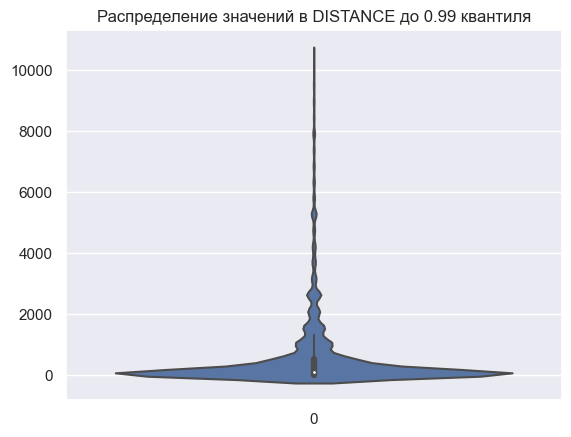

In [45]:
sns.violinplot(df_raw[df_raw['distance'] < df_raw['distance'].quantile(.99)]['distance'])
plt.title('Распределение значений в DISTANCE до 0.99 квантиля');

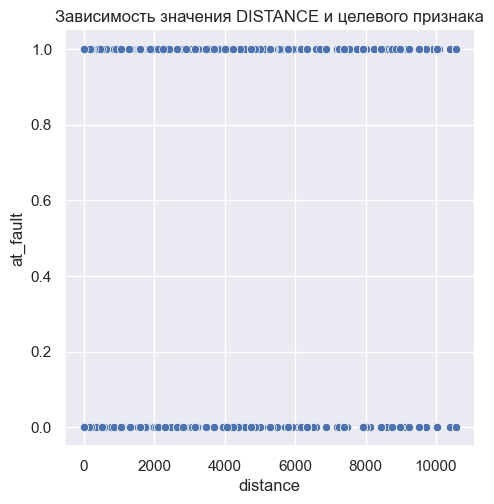

In [46]:
sns.relplot(
    data=df_raw[df_raw['distance'] <= df_raw['distance'].quantile(.99)],
    x='distance', y='at_fault'
)
plt.title('Зависимость значения DISTANCE и целевого признака');

**ВЫВОД:** слабый признак. <font color='red'>**отклоняем**</font>

#### `party_count`

In [47]:
df_raw['party_count'].value_counts()

2     39945
1     10342
3      7931
4      2182
5       665
6       167
7        43
8        27
9        17
10        3
Name: party_count, dtype: int64

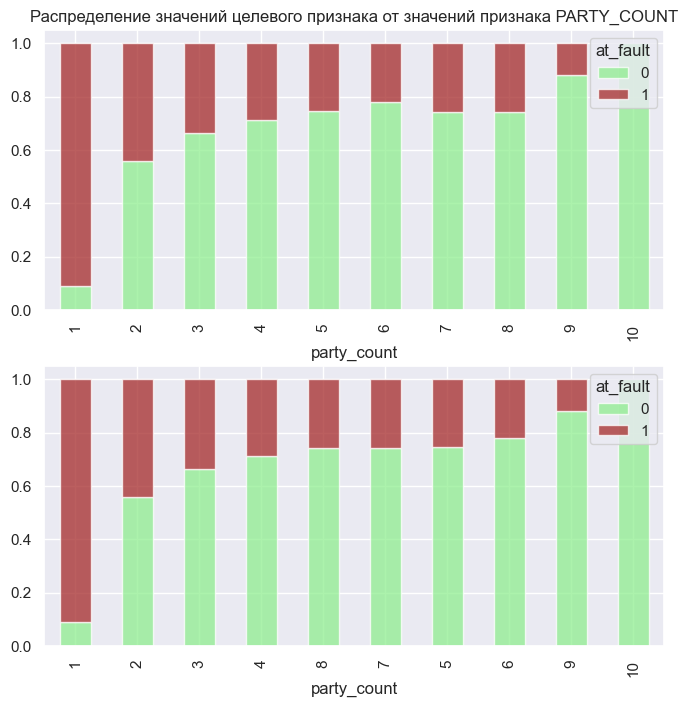

In [48]:
fig, ax = plt.subplots(2, 1, figsize=(8, 8))
cross_prob_bar('party_count', ax[0])
cross_prob_bar_prob_order('party_count', ax[1])
ax[0].set_title(
    'Распределение значений целевого признака от значений признака PARTY_COUNT',
    fontsize=12
)
plt.show()

**ВЫВОД:** как и предполагалось, признак вносит поправку в вероятность признания виновником ДТП. К примеру, если один участник, то вероятность стать виновным максимальная. Если 2 участника, то вероятность делится пополам. С ростом числа участников вероятность быть признанным виновным в ДТП снижается (красная область). Однако, числовое значение не полностью отражает вероятность участника стать виновником ДТП (нижний график отсортирован по убыванию вероятности, значения `party_count` разупорядочиваются).

#### `road_surface`

In [49]:
df_raw['road_surface'].value_counts()

dry         55047
wet          5465
snowy         369
slippery       49
Name: road_surface, dtype: int64

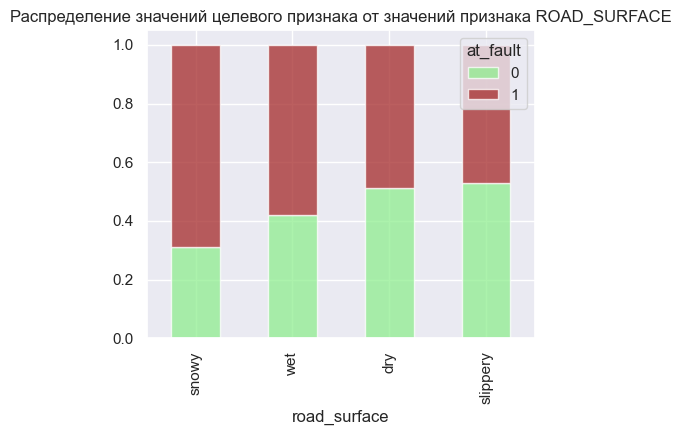

In [50]:
fig, ax = plt.subplots(figsize=(5, 4))
cross_prob_bar_prob_order('road_surface', ax)
ax.set_title(
    'Распределение значений целевого признака от значений признака ROAD_SURFACE',
    fontsize=12
)
plt.show()

**ВЫВОД** Значения целевого признака хорошо дифференцированы в зависимости от значения `road_surface`

#### `road_condition`

In [51]:
df_raw['road_condition'].value_counts()

normal            58980
construction       1030
obstruction         261
other               261
holes               250
loose material      145
reduced width        70
flooded              34
Name: road_condition, dtype: int64

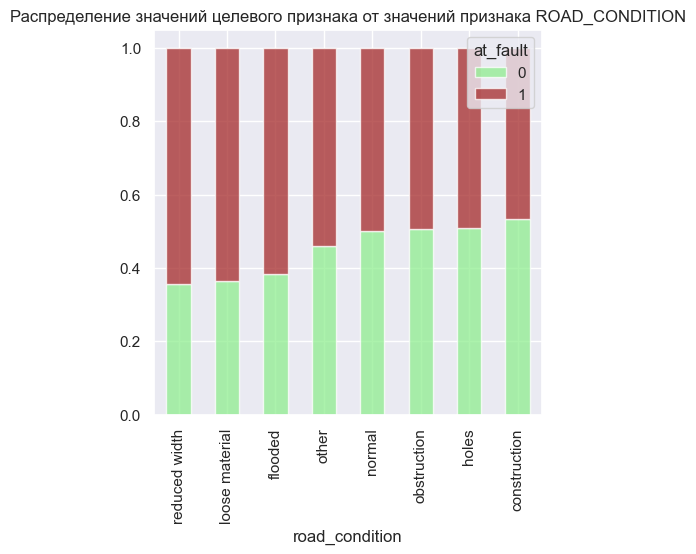

In [52]:
fig, ax = plt.subplots(figsize=(5, 5))
cross_prob_bar_prob_order('road_condition', ax)
ax.set_title(
    'Распределение значений целевого признака от значений признака ROAD_CONDITION',
    fontsize=12
)
plt.show()

**ВЫВОД** Значения целевого признака хорошо дифференцированы в зависимости от значения `road_condition`.

#### `lighting`

In [53]:
df_raw['lighting'] = df_raw['lighting'].map(
    dict(
        zip(
            df_raw['lighting'].value_counts().index,
            [
                'daylight',
                'dark str lights',
                'dark no str lights',
                'dusk or dawn',
                'dark str lights not function'
            ]
        )
    )
)

In [54]:
df_raw['lighting'].value_counts()

daylight                        41253
dark str lights                 12318
dark no str lights               5449
dusk or dawn                     1950
dark str lights not function      160
Name: lighting, dtype: int64

Имеет смысл объединить категории `dark no str lights` и `dark str lights not function` так как по сути это одно и то же.

In [55]:
df_raw.loc[df_raw[df_raw['lighting'] == 'dark str lights not function'].index, 'lighting'] = 'dark no str lights'

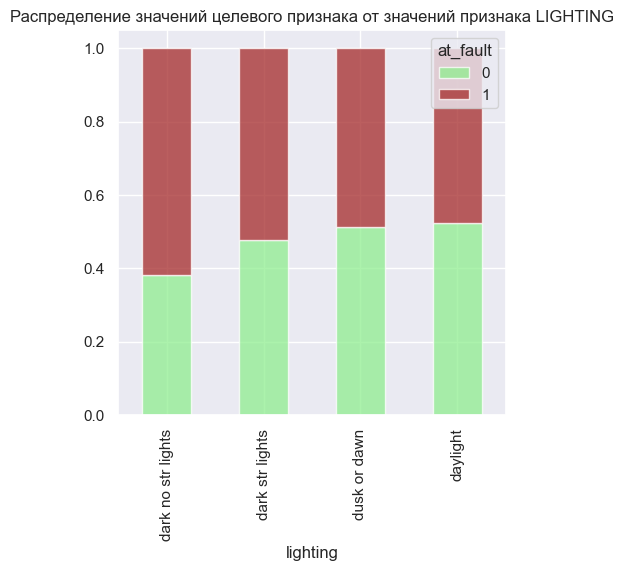

In [56]:
fig, ax = plt.subplots(figsize=(5, 5))
cross_prob_bar_prob_order('lighting', ax)
ax.set_title(
    'Распределение значений целевого признака от значений признака LIGHTING',
    fontsize=12
)
plt.show()

**ВЫВОД** значения целевого признака хорошо дифференцированы в зависимости от значения `lighting`

#### `day_of_week`

In [57]:
df_raw['day_of_week'].value_counts()

friday       10076
saturday     10062
sunday        8703
thursday      8471
wednesday     8291
tuesday       7924
monday        7795
Name: day_of_week, dtype: int64

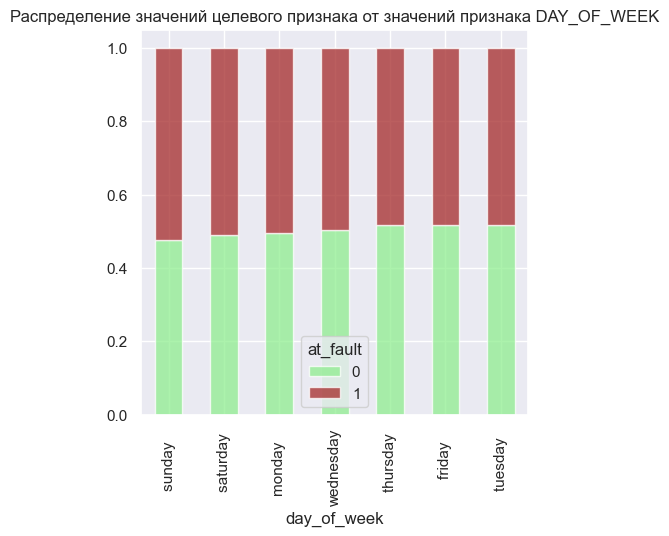

In [58]:
fig, ax = plt.subplots(figsize=(5, 5))
cross_prob_bar_prob_order('day_of_week', ax)
ax.set_title(
    'Распределение значений целевого признака от значений признака DAY_OF_WEEK',
    fontsize=12
)
plt.show()

**ВЫВОД** значения целевого признака слабо дифференцированы в зависимости от значения `day_of_week`. <font color='red'>**отклоняем**</font>

#### `hour`

In [59]:
df_raw['hour'].value_counts().sort_index()

0.0000     1133
1.0000     1196
2.0000     1228
3.0000      747
4.0000      538
5.0000      744
6.0000     1244
7.0000     2845
8.0000     2758
9.0000     2244
10.0000    2540
11.0000    3055
12.0000    3549
13.0000    3801
14.0000    4430
15.0000    5323
16.0000    4502
17.0000    4599
18.0000    4166
19.0000    2870
20.0000    2455
21.0000    2096
22.0000    1695
23.0000    1462
Name: hour, dtype: int64

In [60]:
df_raw['time_cat'] = pd.cut(df_raw['hour'] , 4, labels=['night', 'morning', 'day', 'evening'])

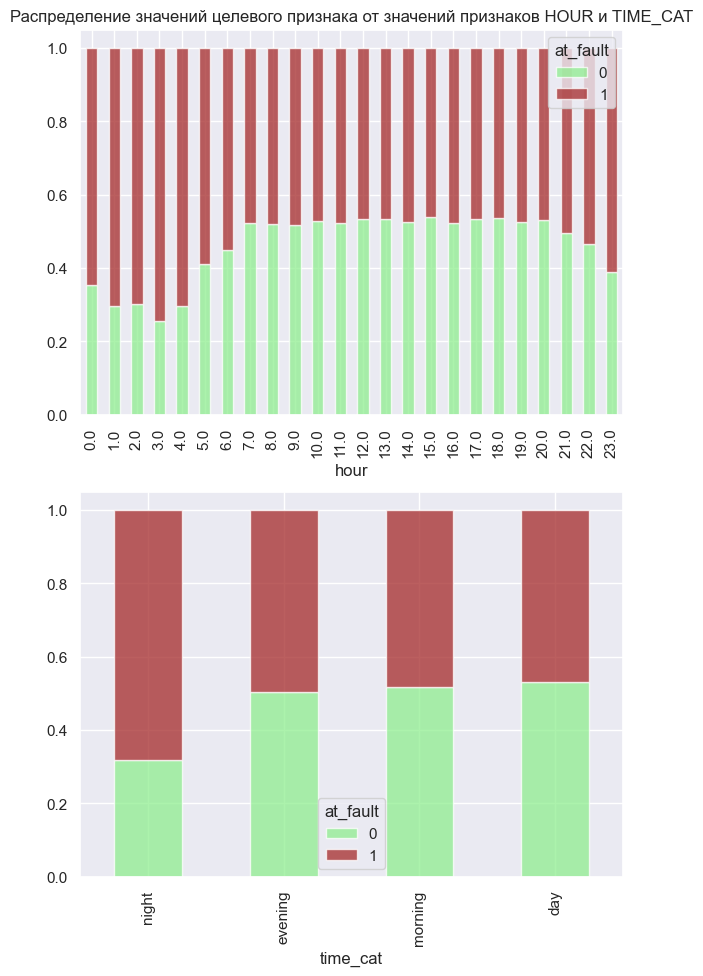

In [61]:
fig, ax = plt.subplots(2, 1, figsize=(7, 11))
cross_prob_bar('hour', ax[0])
cross_prob_bar_prob_order('time_cat', ax[1])
ax[0].set_title(
    'Распределение значений целевого признака от значений признаков HOUR и TIME_CAT',
    fontsize=12
)
plt.show()

**ВЫВОД** признак `hour` переведен в признак с меньшим числом значений `time_cat`, значения целевого признака хорошо дифференцированы в зависимости от значения `time_cat`

#### `insurance_premium`

In [62]:
df_raw['insurance_premium'].nunique()

106

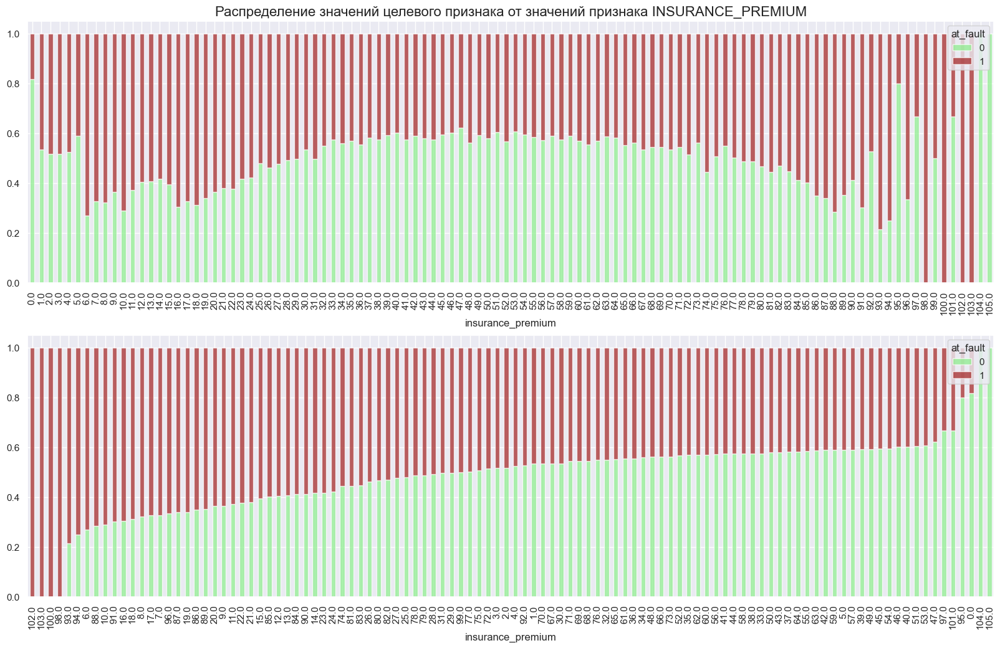

In [63]:
fig, ax = plt.subplots(2, 1, figsize=(20, 12))

cross_prob_bar('insurance_premium', ax[0])
cross_prob_bar_prob_order('insurance_premium', ax[1])
ax[0].set_title(
    'Распределение значений целевого признака от значений признака INSURANCE_PREMIUM',
    fontsize=16
)
plt.show()

**ВЫВОД:** C одной стороны - хорошая корреляция с целевым признаком, с другой - числовое значение не является индикатором роста или снижения вероятности, что водитель - виновник ДТП.

#### `cellphone_in_use`

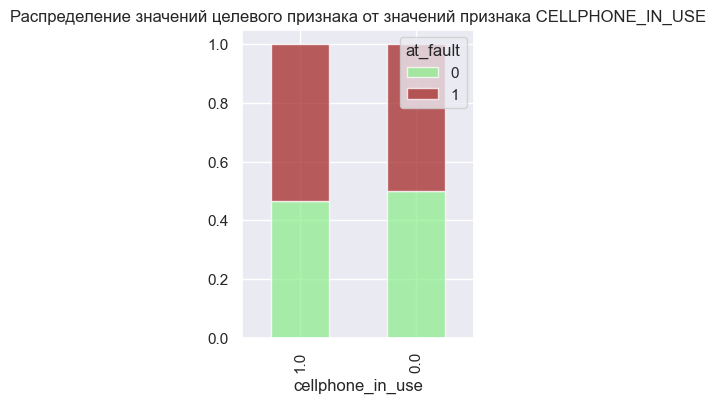

In [64]:
fig, ax = plt.subplots(figsize=(3, 4))

cross_prob_bar_prob_order('cellphone_in_use', ax)
ax.set_title(
    'Распределение значений целевого признака от значений признака CELLPHONE_IN_USE',
    fontsize=12
)
plt.show()

**ВЫВОД:** слабый признак. Также нужно учесть, что в столбце `cellphone_in_use` присутствует 6114 пропуска, которые не представляется возможным восстановить. <font color='red'>**отклоняем**</font>

#### `vehicle_type`

In [65]:
df_raw['vehicle_type'].value_counts()

sedan        36192
coupe        19035
hatchback     3131
minivan       2907
other           57
Name: vehicle_type, dtype: int64

Лучше удалить значения `other`, так как их частота крайне мала по сравнению с остальными.

In [66]:
df_raw = df_raw.drop(
    df_raw.query('vehicle_type not in ["sedan", "coupe", "hatchback", "minivan"]').index,
    axis=0
)

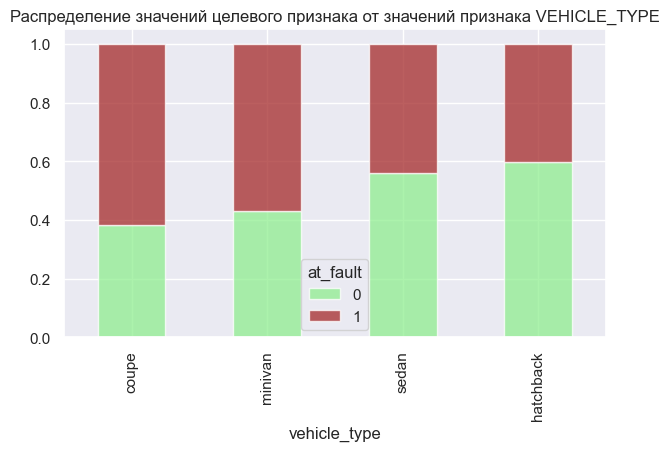

In [67]:
fig, ax = plt.subplots(figsize=(7, 4))

cross_prob_bar_prob_order('vehicle_type', ax)
ax.set_title(
    'Распределение значений целевого признака от значений признака VEHICLE_TYPE',
    fontsize=12
)
plt.show()

**ВЫВОД:** значения целевого признака хорошо дифференцированы в зависимости от значения `vehicle_type`

#### `vehicle_transmission`

In [68]:
df_raw['vehicle_transmission'].value_counts()

manual    33181
auto      27310
Name: vehicle_transmission, dtype: int64

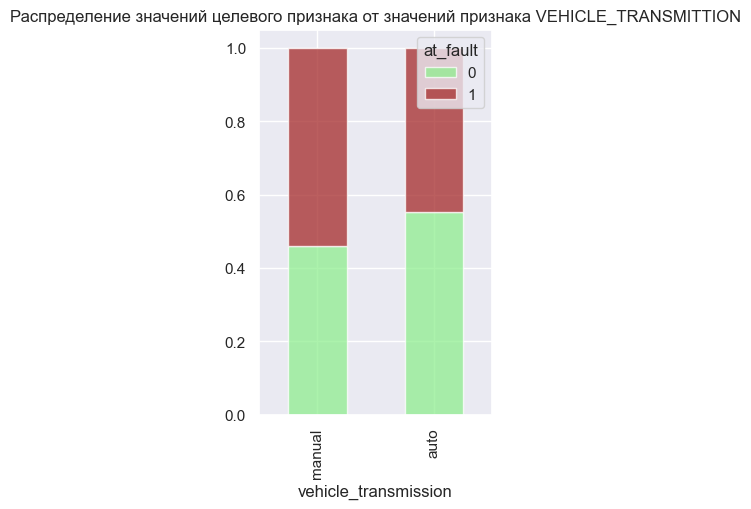

In [69]:
fig, ax = plt.subplots(figsize=(3, 5))

cross_prob_bar_prob_order('vehicle_transmission', ax)
ax.set_title(
    'Распределение значений целевого признака от значений признака VEHICLE_TRANSMITTION',
    fontsize=12
)
plt.show()

Разница около 10 процентных пунктов. Логика на диаграмме есть: с ручной коробкой передач сложнее обращаться, чем с автоматической. Водители автомобилей с ручной коробкой могут совершать ошибки, связанные с управлениям коробкой, которые приводят к ДТП.

**ВЫВОД:** значения целевого признака хорошо дифференцированы в зависимости от значения `vehicle_transmission`

### Выбранные признаки

#### `county_location`

In [70]:
df_raw['county_location'].value_counts()

los angeles        18091
orange              5684
san diego           4232
san bernardino      3843
riverside           3458
sacramento          2326
santa clara         2092
alameda             2084
ventura             1596
kern                1506
fresno              1124
contra costa        1103
san mateo           1063
san joaquin          943
stanislaus           870
santa barbara        853
tulare               762
sonoma               761
san francisco        625
monterey             600
placer               589
solano               588
santa cruz           490
san luis obispo      489
marin                435
merced               420
humboldt             358
butte                346
madera               341
yolo                 301
shasta               297
el dorado            295
kings                259
imperial             228
napa                 223
mendocino            200
nevada               192
sutter               161
tehama               158
tuolumne             128


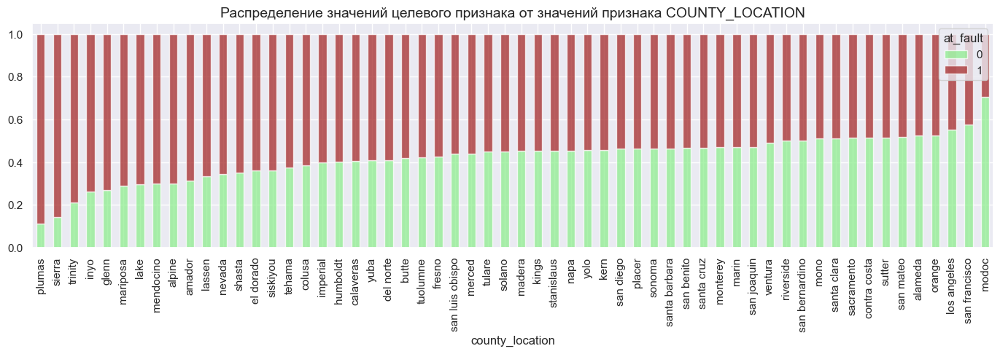

In [71]:
fig, ax = plt.subplots(figsize=(17, 4))

cross_prob_bar_prob_order('county_location', ax)
ax.set_title(
    'Распределение значений целевого признака от значений признака COUNTY_LOCATION',
    fontsize=14
)
plt.show()

**ВЫВОД** значения целевого признака хорошо дифференцированы в зависимости от значения `county_location`

#### `weather`

Заполним пропуски в этом столбце значением `other`

In [72]:
df_raw['weather'] = df_raw['weather'].fillna('other')

In [73]:
df_raw['weather'].value_counts()

clear      49515
cloudy      8874
raining     2274
other        229
fog          200
snowing      159
wind          14
Name: weather, dtype: int64

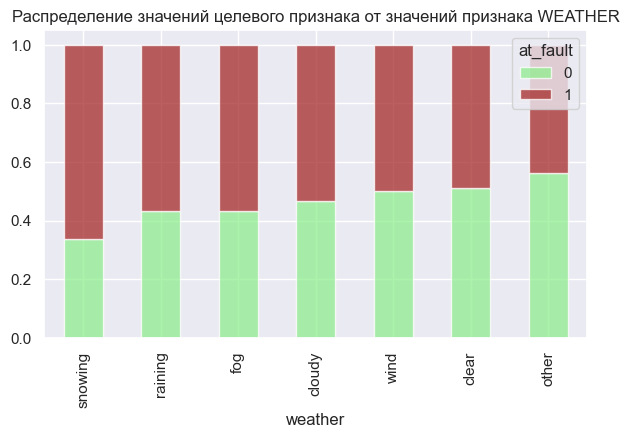

In [74]:
fig, ax = plt.subplots(figsize=(7, 4))

cross_prob_bar_prob_order('weather', ax)
ax.set_title(
    'Распределение значений целевого признака от значений признака WEATHER',
    fontsize=12
)
plt.show()

**ВЫВОД** значения целевого признака хорошо дифференцированы в зависимости от значения `weather`.

#### `type_of_collision`

In [75]:
df_raw['type_of_collision'].value_counts()

rear end      18659
broadside     12774
sideswipe      9557
hit object     8640
other          5444
head-on        3424
overturned     2423
Name: type_of_collision, dtype: int64

Заполним пропуски в этом столбце значением `other`

In [76]:
df_raw['type_of_collision'] = df_raw['type_of_collision'].fillna('other')

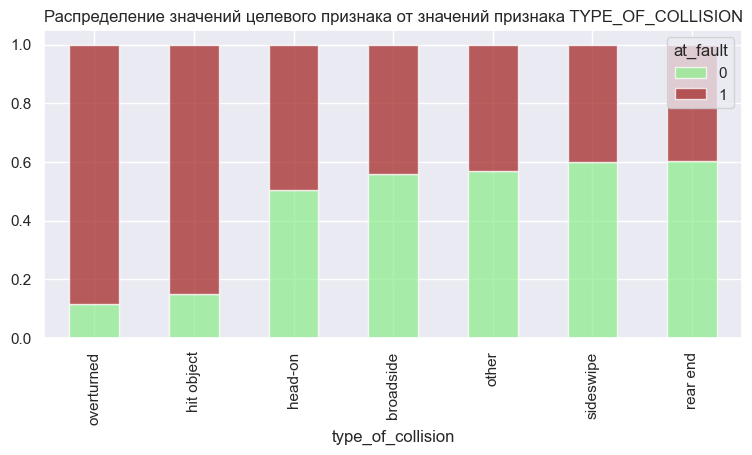

In [77]:
fig, ax = plt.subplots(figsize=(9, 4))

cross_prob_bar_prob_order('type_of_collision', ax)
ax.set_title(
    'Распределение значений целевого признака от значений признака TYPE_OF_COLLISION',
    fontsize=12
)
plt.show()

**ВЫВОД:** для значений `overturned` и `hit object` вероятность быть признанным виновником ДТП крайне высокая.

#### `motor_vehicle_involved_with`

In [78]:
df_raw['motor_vehicle_involved_with'].value_counts()

other motor vehicle               40229
fixed object                       8261
other object                       4694
bicycle                            2876
non-collision                      2442
parked motor vehicle               1882
motor vehicle on other roadway      404
animal                              234
train                                24
Name: motor_vehicle_involved_with, dtype: int64

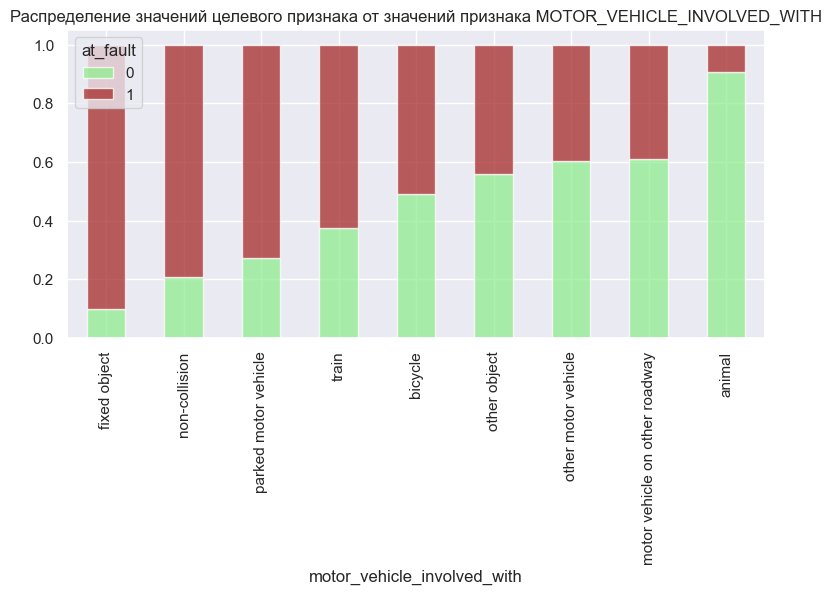

In [79]:
fig, ax = plt.subplots(figsize=(9, 4))

cross_prob_bar_prob_order('motor_vehicle_involved_with', ax)
ax.set_title(
    'Распределение значений целевого признака от значений признака MOTOR_VEHICLE_INVOLVED_WITH',
    fontsize=12)
plt.show()

In [80]:
print(f'В столбце {df_raw["motor_vehicle_involved_with"].isna().sum()} пропусков')

В столбце 219 пропусков


В данном случае среди существующих значений признака трудно выбрать наиболее подходящее для заполнения. В дальнейшем удалим пропуски.

**ВЫВОД:** отличный признак!

#### `party_sobriety`

In [81]:
df_raw['party_sobriety'].value_counts()

had not been drinking                     52047
had been drinking, under influence         4785
impairment unknown                         1454
not applicable                              765
had been drinking, not under influence      658
had been drinking, impairment unknown       425
Name: party_sobriety, dtype: int64

In [82]:
print(f'В столбце {df_raw["party_sobriety"].isna().sum()} пропусков')

В столбце 1131 пропусков


Вероятно, данные не внесены, так как процедуру не проводили. Заполняем пропуски значением `not applicable`

In [83]:
df_raw['party_sobriety'] = df_raw['party_sobriety'].fillna('not applicable')

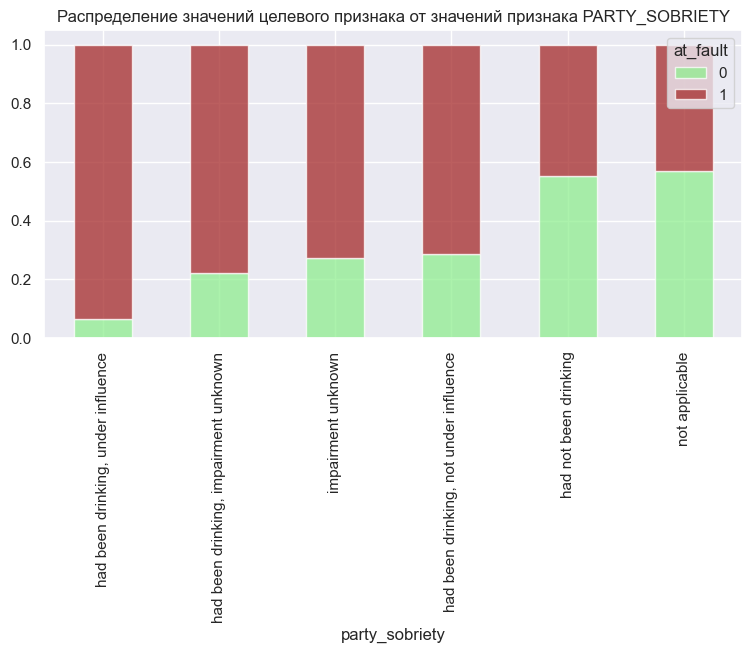

In [84]:
fig, ax = plt.subplots(figsize=(9, 4))

cross_prob_bar_prob_order('party_sobriety', ax)
ax.set_title(
    'Распределение значений целевого признака от значений признака PARTY_SOBRIETY',
    fontsize=12
)
plt.show()

**ВЫВОД:** хороший признак!

#### `vehicle_age`

In [85]:
df_raw['vehicle_age'].value_counts()

3      11918
4       7831
2       7102
5       6078
6       4415
7       4403
8       4130
0       3321
9       3254
1       2956
10      2231
11      1593
12      1010
13       638
14       322
15        46
16        11
17         3
161        2
19         1
Name: vehicle_age, dtype: int64

In [86]:
df_raw[df_raw['vehicle_age']==161][['case_id',
                                    'vehicle_type',
                                    'vehicle_transmission',
                                    'collision_date']
                                  ]

,case_id,vehicle_type,vehicle_transmission,collision_date
58997,5542342,sedan,manual,2012-06-20
61082,5639033,sedan,manual,2012-12-05


Всего 20 различных значений. Есть аномальное значение 161. Вероятнее всего опечатка. Удаляем.

In [87]:
df_raw.drop(index=df_raw[df_raw['vehicle_age'] > 50].index, inplace=True)

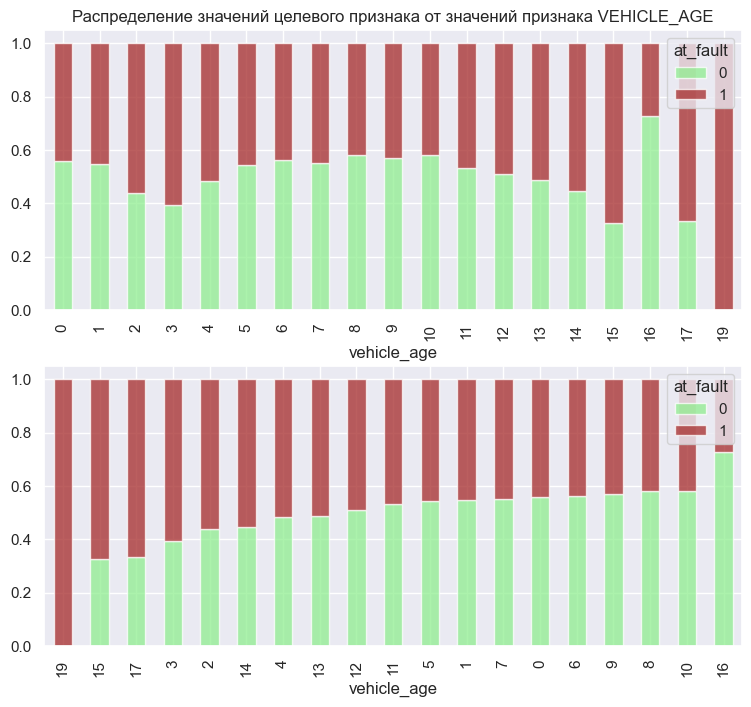

In [88]:
fig, ax = plt.subplots(2, 1, figsize=(9, 8))

cross_prob_bar('vehicle_age', ax[0])
cross_prob_bar_prob_order('vehicle_age', ax[1])
ax[0].set_title(
    'Распределение значений целевого признака от значений признака VEHICLE_AGE',
    fontsize=12
)
plt.show()

**ВЫВОД:** C одной стороны - хорошая корреляция с целевым признаком, с другой - числовое значение не является индикатором роста или снижения вероятности, что водитель - виновник ДТП.

## Финальный датасет

Для модели выбраны 14 признаков и целевой `at_fault`:

In [89]:
cols4model = ['at_fault',
              'party_count',
              'road_condition',
              'road_surface',
              'lighting',
              'time_cat',
              'insurance_premium',
              'vehicle_type',
              'vehicle_transmission',
              'weather',
              'county_location',
              'vehicle_age',
              'type_of_collision',
              'motor_vehicle_involved_with',
              'party_sobriety']

In [90]:
df = df_raw[cols4model].copy()

Проведем стандартные проверки и выведем общую информацию о данных:

In [91]:
df.shape

(61263, 15)

In [92]:
df.duplicated().sum()

3247

Удаляем дубликаты:

In [93]:
df = df.drop_duplicates()
df.shape

(58016, 15)

In [94]:
df.isna().sum()

at_fault                          0
party_count                       0
road_condition                  289
road_surface                    390
lighting                        189
time_cat                        101
insurance_premium              1023
vehicle_type                      0
vehicle_transmission            773
weather                           0
county_location                   0
vehicle_age                       0
type_of_collision                 0
motor_vehicle_involved_with     218
party_sobriety                    0
dtype: int64

Удаляем строки с пропусками

In [95]:
df = df.dropna()
df.shape

(55287, 15)

In [96]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 55287 entries, 0 to 61320
Data columns (total 15 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   at_fault                     55287 non-null  int64   
 1   party_count                  55287 non-null  int64   
 2   road_condition               55287 non-null  object  
 3   road_surface                 55287 non-null  object  
 4   lighting                     55287 non-null  object  
 5   time_cat                     55287 non-null  category
 6   insurance_premium            55287 non-null  float64 
 7   vehicle_type                 55287 non-null  object  
 8   vehicle_transmission         55287 non-null  object  
 9   weather                      55287 non-null  object  
 10  county_location              55287 non-null  object  
 11  vehicle_age                  55287 non-null  int64   
 12  type_of_collision            55287 non-null  object  
 13  m

Баланс классов:

In [97]:
(
    df['at_fault'].value_counts().to_frame()
    .assign(percent = lambda x: round(x / x['at_fault'].sum()*100, 1) )
)

,at_fault,percent
1,27859,50.4000
0,27428,49.6000


In [98]:
df.describe(include=['integer', 'float'])

,at_fault,party_count,insurance_premium,vehicle_age
count,55287.0000,55287.0000,55287.0000,55287.0000
mean,0.5039,2.0880,37.8521,4.9408
std,0.5000,0.8006,16.8927,3.1574
min,0.0000,1.0000,0.0000,0.0000
25%,0.0000,2.0000,24.0000,3.0000
50%,1.0000,2.0000,34.0000,4.0000
75%,1.0000,2.0000,49.0000,7.0000
max,1.0000,10.0000,105.0000,19.0000


In [99]:
df.describe(include='object').T

,count,unique,top,freq
road_condition,55287,8,normal,53413
road_surface,55287,4,dry,49653
lighting,55287,4,daylight,37125
vehicle_type,55287,4,sedan,32824
vehicle_transmission,55287,2,manual,30183
weather,55287,7,clear,44163
county_location,55287,58,los angeles,15031
type_of_collision,55287,7,rear end,16843
motor_vehicle_involved_with,55287,9,other motor vehicle,36500
party_sobriety,55287,6,had not been drinking,47397


Фактически у нас все данные типа `object` являются категориальными. Изменим тип данных:

In [100]:
df[df.describe(include='object').columns] = df[
    df.describe(include='object').columns
].astype('category')

Оптимизируем типы числовых данных:

In [101]:
data_int = df.select_dtypes(include=['integer', 'float']
                           ).apply(pd.to_numeric, downcast='unsigned')
for item in data_int.dtypes.index:
    df[item] = df[item].astype(data_int.dtypes[item])

In [102]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 55287 entries, 0 to 61320
Data columns (total 15 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   at_fault                     55287 non-null  uint8   
 1   party_count                  55287 non-null  uint8   
 2   road_condition               55287 non-null  category
 3   road_surface                 55287 non-null  category
 4   lighting                     55287 non-null  category
 5   time_cat                     55287 non-null  category
 6   insurance_premium            55287 non-null  uint8   
 7   vehicle_type                 55287 non-null  category
 8   vehicle_transmission         55287 non-null  category
 9   weather                      55287 non-null  category
 10  county_location              55287 non-null  category
 11  vehicle_age                  55287 non-null  uint8   
 12  type_of_collision            55287 non-null  category
 13  m

Данные для модели подготовлены. 
- Датасет содержит `55 287` записей в `15` столбцах (14 признаков, 1 целевой), классы сбалансированы, пропусков нет, дубликатов нет. 
- Типы данных: `category(11)`, `uint8(4)`.
- Размер 1.2 MB.

## Разбиение на тренировочные и тестовые данные

In [103]:
fch = df.drop('at_fault', axis=1)
trgt = df['at_fault']

fch_train, fch_test, trgt_train, trgt_test = train_test_split(
    fch, trgt, test_size=TST_SZE, random_state=RND_ST
)

## Выбор метрики

Для оценки моделей выбираем метрику `f1`. Важно минимизировать ошибку 1-го рода и как можно точнее прогнозировать действительно тех, кто является нарушителем (максимум `Precision`), а также выявлять как можно большее число виновников (максимум `Recall`).

## CatBoostClassifier

### Базовая модель

Замерим метрики "базовой" модели на кроссвалидации:

In [104]:
cat_columns = df.select_dtypes(include='category').columns.values
kf = KFold(n_splits=N_FOLDS, shuffle=True, random_state=RND_ST)

In [105]:
CBCPool_train = Pool(data=fch_train,
                     label=trgt_train,
                     cat_features=cat_columns)
base_params_cbc = {'loss_function':'Logloss',
                   'random_state': RND_ST,
                   'eval_metric': 'F1',
                   'verbose': False}

In [106]:
cv_CBC_base_scores = cv(CBCPool_train,
                        base_params_cbc,
                        folds=kf,
                        early_stopping_rounds=25,
                        plot=True,
                        verbose=False)

print('CatBoost_base')
CBCModel_base_CV_score = cv_CBC_base_scores['test-F1-mean'].max()
print(f"Среднее значение F1 = {round(CBCModel_base_CV_score, 4)}")

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Training on fold [0/5]

bestTest = 0.6602555991
bestIteration = 1

Training on fold [1/5]

bestTest = 0.6472218556
bestIteration = 21

Training on fold [2/5]

bestTest = 0.6517890537
bestIteration = 0

Training on fold [3/5]

bestTest = 0.6678032787
bestIteration = 189

Training on fold [4/5]

bestTest = 0.6647847565
bestIteration = 0

CatBoost_base
Среднее значение F1 = 0.6495


Переведем данные в столбцах `party_count`, `insurance_premium` и `vehicle_age` в категориальный тип, попробуем с таким датасетом:

In [107]:
fch_train_all_cat = fch_train.copy()
fch_test_all_cat = fch_test.copy()

fch_train_all_cat[fch_train_all_cat.describe(include='integer').columns] = (
    fch_train_all_cat[fch_train_all_cat.describe(include='integer').columns]
    .astype(str)
    .astype('category')
)

fch_test_all_cat[fch_test_all_cat.describe(include='integer').columns] = (
    fch_test_all_cat[fch_test_all_cat.describe(include='integer').columns]
    .astype(str)
    .astype('category')
)

cat_columns_all_cat = fch_train_all_cat.select_dtypes(include='category').columns.values
CBCPool_train_all_cat = Pool(data=fch_train_all_cat,
                             label=trgt_train,
                             cat_features=cat_columns_all_cat)

In [108]:
cv_CBC_base_all_cat_scores = cv(CBCPool_train_all_cat,
                                base_params_cbc,
                                folds=kf,
                                early_stopping_rounds=25,
                                plot=True,
                                verbose=False)

print('CatBoost_base (all_cat)')
CBCModel_base_all_cat_CV_score = cv_CBC_base_all_cat_scores['test-F1-mean'].max()
print(f"Среднее значение F1 = {round(CBCModel_base_all_cat_CV_score, 4)}")

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Training on fold [0/5]

bestTest = 0.6702045043
bestIteration = 419

Training on fold [1/5]

bestTest = 0.6651017214
bestIteration = 283

Training on fold [2/5]

bestTest = 0.6697175732
bestIteration = 265

Training on fold [3/5]

bestTest = 0.6584558337
bestIteration = 157

Training on fold [4/5]

bestTest = 0.6710302396
bestIteration = 270

CatBoost_base (all_cat)
Среднее значение F1 = 0.6665


In [109]:
pd.DataFrame([[CBCModel_base_CV_score],
              [CBCModel_base_all_cat_CV_score]],
             columns=['F1'],
             index=['CatBoost_base', 'CatBoost_base (all_cat)']
            ).sort_values(by='F1', ascending=False)

,F1
CatBoost_base (all_cat),0.6665
CatBoost_base,0.6495


**ВЫВОД:** для `CatBoost` лучше использовать второй датасет (`all_cat`)

### Подбор гиперпараметров

Найдем оптимальные гиперпараметры с помощью `Optuna`

In [110]:
def objective_CBC(trial, features=fch_train_all_cat, target=trgt_train):
    
    X_train, X_val, y_train, y_val = train_test_split(
        features, target, test_size=TST_SZE, random_state=RND_ST
    )
    cat_cols = features.select_dtypes(include='category').columns.values
    Pool_trn = Pool(data=X_train, label=y_train, cat_features=cat_cols)
    Pool_val = Pool(data=X_val, label=y_val, cat_features=cat_cols)
    params = {
        'max_depth': trial.suggest_int('max_depth', 8, 9),
        'learning_rate': trial.suggest_float('learning_rate', .1, .15),  
        'n_estimators': trial.suggest_int('n_estimators', 1200, 1300),
        'loss_function': 'Logloss',
        'eval_metric': 'F1'
    }
    model = CatBoostClassifier(
        **params,
        random_state=RND_ST
    )
    model.fit(
        Pool_trn,
        eval_set = [Pool_val],
        early_stopping_rounds=50,
        verbose=False
    )
    return model.get_best_score()['validation']['F1']

In [111]:
study_cbc = optuna.create_study(direction = 'maximize', study_name='CatBoostClassifier')
study_cbc.optimize(objective_CBC, n_trials = 25)

[I 2023-03-23 23:31:17,702] A new study created in memory with name: CatBoostClassifier
[I 2023-03-23 23:32:19,740] Trial 0 finished with value: 0.6784944873906983 and parameters: {'max_depth': 9, 'learning_rate': 0.1394998123496377, 'n_estimators': 1294}. Best is trial 0 with value: 0.6784944873906983.
[I 2023-03-23 23:33:04,700] Trial 1 finished with value: 0.6791450613380549 and parameters: {'max_depth': 8, 'learning_rate': 0.14650599350381932, 'n_estimators': 1242}. Best is trial 1 with value: 0.6791450613380549.
[I 2023-03-23 23:34:02,171] Trial 2 finished with value: 0.6795327577450483 and parameters: {'max_depth': 9, 'learning_rate': 0.12004689700035885, 'n_estimators': 1266}. Best is trial 2 with value: 0.6795327577450483.
[I 2023-03-23 23:34:35,532] Trial 3 finished with value: 0.6749297214413493 and parameters: {'max_depth': 9, 'learning_rate': 0.14577332649375294, 'n_estimators': 1273}. Best is trial 2 with value: 0.6795327577450483.
[I 2023-03-23 23:35:23,810] Trial 4 finis

In [112]:
study_cbc.best_params

{'max_depth': 9, 'learning_rate': 0.12952019087277875, 'n_estimators': 1234}

In [113]:
study_cbc.best_trial.value

0.6802997586688684

### CV модели с лучшими гиперпараметрами

In [114]:
best_params_cbc = study_cbc.best_params
best_params_cbc.update(base_params_cbc)

In [115]:
cv_CBC_best_scores = cv(CBCPool_train_all_cat,
                        best_params_cbc,
                        folds=kf,
                        early_stopping_rounds=25,
                        plot=True,
                        verbose=False)

print('CatBoostClassifier_tuned (all_cat)')
CBCModel_best_CV_score = cv_CBC_best_scores['test-F1-mean'].max()
print(f"Среднее значение F1 = {round(CBCModel_best_CV_score, 4)}")

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Training on fold [0/5]

bestTest = 0.684516292
bestIteration = 140

Training on fold [1/5]

bestTest = 0.6667523785
bestIteration = 86

Training on fold [2/5]

bestTest = 0.6727225539
bestIteration = 162

Training on fold [3/5]

bestTest = 0.6697283821
bestIteration = 84

Training on fold [4/5]

bestTest = 0.6775760675
bestIteration = 98

CatBoostClassifier_tuned (all_cat)
Среднее значение F1 = 0.673


Собираем всю статистику по `CatBoostClassifier` вместе.

In [116]:
CBC_stat = pd.DataFrame(
    [
        [CBCModel_base_CV_score],
        [CBCModel_base_all_cat_CV_score],
        [CBCModel_best_CV_score]
    ],
    columns=['F1'],
    index=['CatBoost_base_cv', 'CatBoost_base_(all_cat)_cv', 'CatBoost_tuned_(all_cat)_cv']
)
display(CBC_stat.sort_values(by='F1', ascending=False))

,F1
CatBoost_tuned_(all_cat)_cv,0.6730
CatBoost_base_(all_cat)_cv,0.6665
CatBoost_base_cv,0.6495


Для модели `CatBoostClassifier` оптимально использовать датасет c типом для всех данных `category`. Оптимальные гиперпараметры модели выбраны с помощью `Optuna`, получена метрика для модели с оптимальными гиперпараметрами на кроссвалидации на тренировочных данных.

## LGBMClassifier

### Базовая модель

Замерим метрики "базовой" модели на кроссвалидации:

In [117]:
def lgb_f1(preds, data):
    y_true = data.get_label()
    preds = np.where(preds < 0.5, 0, 1) 
    return 'f1', f1_score(y_true, preds), True

In [118]:
base_params_lgb = {'objective': 'binary',
                   'verbose': -1,
                   'seed': RND_ST
                  }

lgbDS_train = lgb.Dataset(data=fch_train,
                          label=trgt_train,
                          params={'verbose': -1},
                          categorical_feature=list(cat_columns)
                         )

In [119]:
cv_LGB_base_scores = lgb.cv(base_params_lgb,
                            lgbDS_train,
                            folds=kf,
                            feval=lgb_f1,
                            seed=RND_ST)

print('LGBMClassifier_base')
LGBModel_base_CV_score = cv_LGB_base_scores['f1-mean'][0]
print(f"Среднее значение F1: {round(LGBModel_base_CV_score, 4)}")

LGBMClassifier_base
Среднее значение F1: 0.6779


Теперь на датасете со всеми категориальными признаками:

In [120]:
lgbDS_train_all_cat = lgb.Dataset(data=fch_train_all_cat,
                                  label=trgt_train,
                                  params={'verbose': -1},
                                  categorical_feature=list(cat_columns_all_cat)
                                 )

In [121]:
cv_LGB_base_all_cat_scores = lgb.cv(base_params_lgb,
                                    lgbDS_train_all_cat,
                                    folds=kf,
                                    feval=lgb_f1,
                                    seed=RND_ST)

print('LGBMClassifier_base (all cat)')
LGBModel_base_all_cat_CV_score = cv_LGB_base_all_cat_scores['f1-mean'][0]
print(f"Среднее значение F1: {round(LGBModel_base_all_cat_CV_score, 4)}")

LGBMClassifier_base (all cat)
Среднее значение F1: 0.6711


In [122]:
pd.DataFrame([[LGBModel_base_CV_score],
              [LGBModel_base_all_cat_CV_score]],
             columns=['F1'],
             index=['LGBM_base', 'LGBM_base (all_cat)']
            ).sort_values(by='F1', ascending=False)

,F1
LGBM_base,0.6779
LGBM_base (all_cat),0.6711


**ВЫВОД:** для `LGBMClassifier` лучше использовать первый датасет (`int` + `category`)

### Подбор гиперпараметров

Найдем оптимальные гиперпараметры с помощью `Optuna`

In [123]:
def objective_LGB(trial, features=fch_train, target=trgt_train):
    
    X_train, X_val, y_train, y_val = train_test_split(
        features, target, test_size=TST_SZE, random_state=RND_ST
    )
    dtrain = lgb.Dataset(X_train,
                         label=y_train,
                         params={'verbose': -1},
                         categorical_feature=list(cat_columns)
                        )
    dval = lgb.Dataset(X_val,
                       label=y_val,
                       params={'verbose': -1},
                       categorical_feature=list(cat_columns)
                      )
    params = {'objective': 'binary',
              'verbose': -1,
              'random_state': RND_ST,
              'early_stopping_round': 50,
              'metric': None,
              'n_estimators': trial.suggest_int('n_estimators', 800, 1000),        
              'max_depth': trial.suggest_int('max_depth', 5, 7),                    
              'learning_rate': trial.suggest_float('learning_rate', .02, .04), 
              'num_leaves': trial.suggest_int('num_leaves', 50, 100),
              'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 85, 115),
              'lambda_l1': trial.suggest_float('lambda_l1', 1e-4, 1e-3),
              'lambda_l2': trial.suggest_float('lambda_l2', 1e-2, 1e-1)
             }
    evals_result ={}
    model = lgb.train(params,
                      dtrain,
                      valid_sets=[dval],
                      valid_names=['valid'],
                      feval=lgb_f1,
                      evals_result=evals_result,
                      verbose_eval=False)

    return np.max(evals_result['valid']['f1'])

In [124]:
study_lgb = optuna.create_study(direction='maximize', study_name='LGBM_Classifier')
study_lgb.optimize(objective_LGB, n_trials=15)

[I 2023-03-23 23:53:07,622] A new study created in memory with name: LGBM_Classifier
[I 2023-03-23 23:53:08,238] Trial 0 finished with value: 0.705322628605412 and parameters: {'n_estimators': 838, 'max_depth': 7, 'learning_rate': 0.03264531380950226, 'num_leaves': 54, 'min_data_in_leaf': 107, 'lambda_l1': 0.0001599561972150318, 'lambda_l2': 0.06446228013088853}. Best is trial 0 with value: 0.705322628605412.
[I 2023-03-23 23:53:08,782] Trial 1 finished with value: 0.7051002182972812 and parameters: {'n_estimators': 962, 'max_depth': 7, 'learning_rate': 0.03296547356237261, 'num_leaves': 73, 'min_data_in_leaf': 87, 'lambda_l1': 0.00019489866544498882, 'lambda_l2': 0.06352341663938821}. Best is trial 0 with value: 0.705322628605412.
[I 2023-03-23 23:53:09,286] Trial 2 finished with value: 0.6935483870967742 and parameters: {'n_estimators': 971, 'max_depth': 5, 'learning_rate': 0.02962845166422811, 'num_leaves': 60, 'min_data_in_leaf': 99, 'lambda_l1': 0.00020621534494196577, 'lambda_l2'

In [125]:
study_lgb.best_params

{'n_estimators': 951,
 'max_depth': 7,
 'learning_rate': 0.03292211362779217,
 'num_leaves': 73,
 'min_data_in_leaf': 91,
 'lambda_l1': 0.0005074281784973825,
 'lambda_l2': 0.0650812253628854}

In [126]:
study_lgb.best_trial.value

0.7056842939195881

### CV модели с лучшими гиперпараметрами

Обучаем и тестируем модель с лучшими гиперпараметрами, сохраняем результаты.

In [127]:
best_params_lgb = study_lgb.best_params
best_params_lgb.update(base_params_lgb)

lgbDS_train = lgb.Dataset(data=fch_train,
                          label=trgt_train,
                          params={'verbose': -1},
                          categorical_feature=list(cat_columns)
                         )

In [128]:
cv_LGB_best_scores = lgb.cv(best_params_lgb,
                            lgbDS_train,
                            folds=kf,
                            feval=lgb_f1)

print('LGBMClassifier_tuned (all_cat)')
LGBModel_best_CV_score = cv_LGB_best_scores['f1-mean'][0]
print(f"Среднее значение F1: {round(LGBModel_best_CV_score, 4)}")

LGBMClassifier_tuned (all_cat)
Среднее значение F1: 0.6985


Собираем всю статистику по `LGBClassifier` вместе.

In [129]:
LGB_stat = pd.DataFrame(
    [
        [LGBModel_base_CV_score],
        [LGBModel_base_all_cat_CV_score],
        [LGBModel_best_CV_score]
    ],
    columns=['F1'],
    index=['LGBM_base_cv', 'LGBM_base_(all_cat)_cv', 'LGBM_tuned_cv']
)
display(LGB_stat.sort_values(by='F1', ascending=False))

,F1
LGBM_tuned_cv,0.6985
LGBM_base_cv,0.6779
LGBM_base_(all_cat)_cv,0.6711


Для модели `LGBMClassifier` оптимально использовать датасет в исходном виде. Оптимальные гиперпараметры модели выбраны с помощью `Optuna`, получена метрика для модели с оптимальными гиперпараметрами на кроссвалидации на тренировочных данных.

## Нейронная сеть

### Подготовка данных

#### `OneHotEncoder`

In [130]:
encoder = OneHotEncoder(drop='first').fit(fch_train[cat_columns])
encoder.categories_

[array(['construction', 'flooded', 'holes', 'loose material', 'normal',
        'obstruction', 'other', 'reduced width'], dtype=object),
 array(['dry', 'slippery', 'snowy', 'wet'], dtype=object),
 array(['dark no str lights', 'dark str lights', 'daylight',
        'dusk or dawn'], dtype=object),
 array(['day', 'evening', 'morning', 'night'], dtype=object),
 array(['coupe', 'hatchback', 'minivan', 'sedan'], dtype=object),
 array(['auto', 'manual'], dtype=object),
 array(['clear', 'cloudy', 'fog', 'other', 'raining', 'snowing', 'wind'],
       dtype=object),
 array(['alameda', 'alpine', 'amador', 'butte', 'calaveras', 'colusa',
        'contra costa', 'del norte', 'el dorado', 'fresno', 'glenn',
        'humboldt', 'imperial', 'inyo', 'kern', 'kings', 'lake', 'lassen',
        'los angeles', 'madera', 'marin', 'mariposa', 'mendocino',
        'merced', 'modoc', 'mono', 'monterey', 'napa', 'nevada', 'orange',
        'placer', 'plumas', 'riverside', 'sacramento', 'san benito',
        'sa

После кодирования должно получиться столбцов:

In [131]:
sum([(len(item)-1) for item in encoder.categories_])

102

Применяем, проверяем...

In [132]:
train_ohe = encoder.transform(fch_train[cat_columns]).toarray()
test_ohe = encoder.transform(fch_test[cat_columns]).toarray()
train_ohe.shape, test_ohe.shape

((44229, 102), (11058, 102))

#### `StandardScaler`

In [133]:
col2scl = np.setdiff1d(fch_train.columns, cat_columns, assume_unique=False)
scaler = StandardScaler().fit(fch_train[col2scl])

In [134]:
train_scl = scaler.transform(fch_train[col2scl])
test_scl = scaler.transform(fch_test[col2scl])
train_scl.shape, test_scl.shape

((44229, 3), (11058, 3))

#### Объединение в тензоры

In [135]:
nn_train = np.concatenate((train_ohe, train_scl), axis=1)
nn_test = np.concatenate((test_ohe, test_scl), axis=1)
X_trn = torch.FloatTensor(nn_train)
X_tst = torch.FloatTensor(nn_test)
y_trn = torch.FloatTensor(trgt_train.values)
y_tst = torch.FloatTensor(trgt_test.values)

In [136]:
X_trn.size(), X_tst.size()

(torch.Size([44229, 105]), torch.Size([11058, 105]))

Тренировочные и тестовые данные обработаны классами `OneHotEncoder` и `StandardScaler`, конвертированы в тензоры.

### Построение нейронной сети

Создаем класс для задания архитектуры сети, функуцию активации начальных параметров сети.

In [137]:
class NNet(nn.Module):
    
    '''
    Класс строит полносвязную нейронную сеть произвольной конфигурации
    Параметры слоёв задается элементами тензора net
    Коэффициенты dropout для внутренних слоёв задаются элементами тензора dropout
    Нормализация добавляется, если batch_norm = True
    '''
    
    def __init__(self, net_tensor, dropout_tensor, batch_norm=False):
        super(NNet, self).__init__()
        
        self.net_layers = []
        
        for i in range(1, net_tensor.size()[0]-1):
            self.net_layers.append( nn.Linear(net_tensor[i-1].item(), net_tensor[i].item()) )
            if batch_norm:
                self.net_layers.append( nn.BatchNorm1d(net_tensor[i].item()) )
            self.net_layers.append( nn.ReLU() )
            self.net_layers.append( nn.Dropout(dropout_tensor[i-1].item()) )
        self.net_layers.append( nn.Linear(net_tensor[-2].item(), net_tensor[-1].item())) 
        self.net_layers.append( nn.Sigmoid() )
        
        self.net = nn.Sequential(*self.net_layers)
        
    def forward(self, X_batch):
        out = self.net.forward(X_batch)
        return out

функция активации `ReLU()` несимметрична относительно 0 (такая, что $f(-x) \not= f(x)$), поэтому для весов применим инициализацию Кайминга. Смещения ативируем обычным нормальным распределением с параметрами $mean=0, std=1$

In [138]:
def init_weights(layer):
    
    '''Функция активации начальных параметров (веса, смещения)'''
    
    if type(layer) == nn.Linear:
        nn.init.kaiming_normal_(
            layer.weight,
            mode='fan_in',
            nonlinearity='relu'
        ) 
        nn.init.normal_(
            layer.bias,
            mean=0,
            std=1
        )

Задаем конфигурацию сети.

In [139]:
'''Определяет число нейронов по слоям (входной слой по кол-ву признаков, выходной слой = 1)'''

net_tensor = torch.ByteTensor([X_trn.size()[1], 64, 64, 32, 32, 16, 1])

### Оптимизация нейронной сети

Находим параметры DropOut, оптимальный размер батча и темп обучения

In [165]:
param_grid = {'module__net_tensor': [net_tensor],
              'module__dropout_tensor':
              [
                  torch.FloatTensor([.2, .2, .1, .1, .0]),
                  torch.FloatTensor([.4, .3, .2, .1, .0])
              ],
              'module__batch_norm':[True],
              'batch_size':[150, 100],
              'lr':[.005, .0025]
             }

In [166]:
random.seed(RND_ST)
np.random.seed(RND_ST)
torch.manual_seed(RND_ST)
torch.use_deterministic_algorithms(True)

skorch_cls = NeuralNetClassifier(module=NNet,
                                 criterion = nn.BCEWithLogitsLoss,
                                 optimizer=torch.optim.Adam,
                                 max_epochs=50,
                                 verbose=0)

In [167]:
kf_net = KFold(n_splits=3, shuffle=True, random_state=RND_ST)

grid = GridSearchCV(skorch_cls,
                    param_grid,
                    cv=kf_net,
                    scoring='f1',
                    verbose=4,
                    error_score='raise')

grid.fit(X_trn.numpy().astype('float32'),
         y_trn.numpy().astype('float32').reshape(-1, 1)
        )

Fitting 3 folds for each of 8 candidates, totalling 24 fits
[CV 1/3] END batch_size=150, lr=0.005, module__batch_norm=True, module__dropout_tensor=tensor([0.2000, 0.2000, 0.1000, 0.1000, 0.0000]), module__net_tensor=tensor([105,  64,  64,  32,  32,  16,   1], dtype=torch.uint8);, score=0.670 total time= 1.8min
[CV 2/3] END batch_size=150, lr=0.005, module__batch_norm=True, module__dropout_tensor=tensor([0.2000, 0.2000, 0.1000, 0.1000, 0.0000]), module__net_tensor=tensor([105,  64,  64,  32,  32,  16,   1], dtype=torch.uint8);, score=0.672 total time= 1.8min
[CV 3/3] END batch_size=150, lr=0.005, module__batch_norm=True, module__dropout_tensor=tensor([0.2000, 0.2000, 0.1000, 0.1000, 0.0000]), module__net_tensor=tensor([105,  64,  64,  32,  32,  16,   1], dtype=torch.uint8);, score=0.672 total time= 1.8min
[CV 1/3] END batch_size=150, lr=0.005, module__batch_norm=True, module__dropout_tensor=tensor([0.4000, 0.3000, 0.2000, 0.1000, 0.0000]), module__net_tensor=tensor([105,  64,  64,  32, 

GridSearchCV(cv=KFold(n_splits=3, random_state=42, shuffle=True),
             error_score='raise',
             estimator=<class 'skorch.classifier.NeuralNetClassifier'>[uninitialized](
  module=<class '__main__.NNet'>,
),
             param_grid={'batch_size': [150, 100], 'lr': [0.005, 0.0025],
                         'module__batch_norm': [True],
                         'module__dropout_tensor': [tensor([0.2000, 0.2000, 0.1000, 0.1000, 0.0000]),
                                                    tensor([0.4000, 0.3000, 0.2000, 0.1000, 0.0000])],
                         'module__net_tensor': [tensor([105,  64,  64,  32,  32,  16,   1], dtype=torch.uint8)]},
             scoring='f1', verbose=4)

Выбраны параметры:

In [168]:
grid.best_params_

{'batch_size': 100,
 'lr': 0.0025,
 'module__batch_norm': True,
 'module__dropout_tensor': tensor([0.2000, 0.2000, 0.1000, 0.1000, 0.0000]),
 'module__net_tensor': tensor([105,  64,  64,  32,  32,  16,   1], dtype=torch.uint8)}

In [169]:
grid.best_score_

0.675256785308914

### Функции для обучения и построения кривой обучения

In [233]:
def net_train(net_model,
              f_train, t_train,
              f_val, t_val,
              num_epochs, batch_size, lr,
              mode = 'validation',
              frq=1, verbose=True, rtrn=True, best_only=False):
    
    '''
    Функция обучения сети
    Возвращает статистику обучения (по эпохам) в виде тензора: 
    - номер эпохи,
    - f1 на трейне, 
    - f1 на валидации.
    Возвращает лучшие показатели на валидации в виде тензора:
    - номер эпохи,
    - f1 на валидации.
    Возвращает обученную модель.
    Выводит данные обучения. Частота вывода задается параметром frq
    Вывод данных параметром verbose.
    '''
    
    loss_func = nn.BCELoss()
    learning_rate = lr
    optimizer = torch.optim.Adam(net_model.parameters(), lr=learning_rate)
    num_batches = ceil(len(f_train)/batch_size)
    stat = []
    
    for epoch in range(num_epochs):
        order = np.random.permutation(len(f_train))
        
        net_model.train()                                                                     
        for batch_idx in range(num_batches):
            
            start_index = batch_idx * batch_size
            batch_indexes = order[start_index : start_index + batch_size]
            X_batch = f_train[batch_indexes]
            y_batch = t_train[batch_indexes]
        
            optimizer.zero_grad()
            preds = net_model.forward(X_batch).flatten()
            loss_value = loss_func(preds, y_batch)
            loss_value.backward()
            optimizer.step()
        
        net_model.eval()
        with torch.no_grad():                              
            trn_preds = np.rint(
                net_model.forward(f_train).flatten().detach().numpy()
            )
            val_preds = np.rint(
                net_model.forward(f_val).flatten().detach().numpy()
            )
            
            f1_trn = f1_score(t_train.flatten().detach().numpy(), trn_preds)
            f1_val = f1_score(t_val.flatten().detach().numpy(), val_preds)
            stat.append([epoch, f1_trn, f1_val])        
        
        if (epoch % frq == 0 or epoch == num_epochs -1) & verbose:
            print('epoch =', epoch,
                  '\t',
                  'f1(train) =',
                  '{0:0.6f}'.format(f1_trn),
                  '\t',
                  'f1(' + mode + ') =',
                  '{0:0.6f}'.format(f1_val) )
    
    stat_t = torch.Tensor(stat)
    best_result = torch.max(stat_t[:, 2], dim=0, keepdim=False)
    print('\nЛучший показатель f1(' + mode + '):',
          '{0:0.6f}'.format(best_result.values.item()),
          ', epoch:',
          int(best_result.indices.item()),
          '\n' )
    
    if rtrn:
        if best_only:
            return best_result
        else:
            return best_result, stat_t, net_model

In [234]:
def learning_curve(df, ylim, pal='tab10'):
    
    ''' Функция построения кривых обучения и тестирования'''
    
    fig, ax = plt.subplots(figsize=(16, 7))

    sns.lineplot(data=df, palette=pal, linewidth=1, ax=ax)
    
    ax.yaxis.set_major_locator(ticker.MultipleLocator(.01))
    ax.yaxis.set_minor_locator(ticker.MultipleLocator(.0025))
    ax.set_ylim(ylim[0], ylim[1])
    ax.grid(which='minor', color = 'white', linestyle = ':')
    
    
    ax.set_title('Кривые обучения', size=16)
    ax.set_xlabel('Эпоха', fontsize=14)
    ax.set_ylabel('F1', fontsize=14)
    
    plt.show()

**ВЫВОД** для нейронной сети выбрана конфигурация, определены параметры DropOut, размера батча, темпа обучения

## Тестирование моделей

### Тестирование CatBoostClassifier

In [172]:
CBCModel_best = CatBoostClassifier(**best_params_cbc)

CBCModel_best.fit(CBCPool_train_all_cat)
trgt_probes_cbc_best = CBCModel_best.predict_proba(fch_test_all_cat)
trgt_preds_cbc_best = CBCModel_best.predict(fch_test_all_cat)

CBC_best_TESTmetrics_all_cat = pd.DataFrame(
    data=[[f1_score(trgt_test, trgt_preds_cbc_best),
           accuracy_score(trgt_test, trgt_preds_cbc_best),
           precision_score(trgt_test, trgt_preds_cbc_best),
           recall_score(trgt_test, trgt_preds_cbc_best),
           roc_auc_score(trgt_test, trgt_probes_cbc_best[:,1])]],
    columns=['F1', 'Accuracy', 'Precision', 'Recall', 'AUC'],
    index=['CatBoost_tuned_(all_cat)_test'])

CBC_best_TESTmetrics_all_cat

,F1,Accuracy,Precision,Recall,AUC
CatBoost_tuned_(all_cat)_test,0.6708,0.7016,0.7518,0.6055,0.7670


### Тестирование LGBMClassifier

In [173]:
lgbDS_train = lgb.Dataset(data=fch_train,
                          label=trgt_train,
                          params={'verbose': -1},
                          categorical_feature=list(cat_columns)
                         )

LGBModel_best = lgb.train(best_params_lgb,
                          lgbDS_train)

trgt_probs_lgb_best = LGBModel_best.predict(fch_test)
trgt_preds_lgb_best = np.rint(trgt_probs_lgb_best)

LGB_best_TESTmetrics = pd.DataFrame(
    data=[[f1_score(trgt_test, trgt_preds_lgb_best),
           accuracy_score(trgt_test, trgt_preds_lgb_best),
           precision_score(trgt_test, trgt_preds_lgb_best),
           recall_score(trgt_test, trgt_preds_lgb_best),
           roc_auc_score(trgt_test, trgt_probs_lgb_best)]],
    columns=['F1', 'Accuracy', 'Precision', 'Recall', 'AUC'],
    index=['LightGBM_tuned_test'])

LGB_best_TESTmetrics

,F1,Accuracy,Precision,Recall,AUC
LightGBM_tuned_test,0.6634,0.6993,0.7575,0.5901,0.7642


### Тестирование нейронной сети

Создаем экземпляр класса `NNet`

In [235]:
random.seed(RND_ST)
np.random.seed(RND_ST)
torch.manual_seed(RND_ST)
torch.use_deterministic_algorithms(True)

MyNet = NNet(grid.best_params_['module__net_tensor'],
             grid.best_params_['module__dropout_tensor'],
             grid.best_params_['module__batch_norm'])
MyNet.apply(init_weights)

NNet(
  (net): Sequential(
    (0): Linear(in_features=105, out_features=64, bias=True)
    (1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Dropout(p=0.20000000298023224, inplace=False)
    (4): Linear(in_features=64, out_features=64, bias=True)
    (5): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): Dropout(p=0.20000000298023224, inplace=False)
    (8): Linear(in_features=64, out_features=32, bias=True)
    (9): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU()
    (11): Dropout(p=0.10000000149011612, inplace=False)
    (12): Linear(in_features=32, out_features=32, bias=True)
    (13): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (14): ReLU()
    (15): Dropout(p=0.10000000149011612, inplace=False)
    (16): Linear(in_features=32, out_features=16, bias=True)
    (17): BatchNorm1d(16,

Обучаем с валидацией на трейне, находим лучшую эпоху. Размер батча и темп обучения берем из результатов работы `GridSearchCV`

In [236]:
f_train, f_val, t_train, t_val = train_test_split(
    X_trn, y_trn, test_size=TST_SZE, random_state=RND_ST
)

In [237]:
best_learn = net_train_test(
    MyNet,
    f_train, t_train,
    f_val, t_val,
    num_epochs=20,
    batch_size=grid.best_params_['batch_size'],
    lr=grid.best_params_['lr'],
    best_only=True
)

epoch = 0 	 f1(train) = 0.620450 	 f1(validation) = 0.623290
epoch = 1 	 f1(train) = 0.637564 	 f1(validation) = 0.634846
epoch = 2 	 f1(train) = 0.666732 	 f1(validation) = 0.663135
epoch = 3 	 f1(train) = 0.662080 	 f1(validation) = 0.656712
epoch = 4 	 f1(train) = 0.634780 	 f1(validation) = 0.625547
epoch = 5 	 f1(train) = 0.655685 	 f1(validation) = 0.648401
epoch = 6 	 f1(train) = 0.673285 	 f1(validation) = 0.658188
epoch = 7 	 f1(train) = 0.655011 	 f1(validation) = 0.641246
epoch = 8 	 f1(train) = 0.636051 	 f1(validation) = 0.617224
epoch = 9 	 f1(train) = 0.645141 	 f1(validation) = 0.633622
epoch = 10 	 f1(train) = 0.674756 	 f1(validation) = 0.658026
epoch = 11 	 f1(train) = 0.675645 	 f1(validation) = 0.655789
epoch = 12 	 f1(train) = 0.696750 	 f1(validation) = 0.674224
epoch = 13 	 f1(train) = 0.674659 	 f1(validation) = 0.655099
epoch = 14 	 f1(train) = 0.684413 	 f1(validation) = 0.660993
epoch = 15 	 f1(train) = 0.706872 	 f1(validation) = 0.680836
epoch = 16 	 f1(tr

Обучаем до лучшей эпохи

In [238]:
random.seed(RND_ST)
np.random.seed(RND_ST)
torch.manual_seed(RND_ST)
torch.use_deterministic_algorithms(True)

MyNet = NNet(grid.best_params_['module__net_tensor'],
             grid.best_params_['module__dropout_tensor'],
             grid.best_params_['module__batch_norm'])
MyNet.apply(init_weights)

NNet(
  (net): Sequential(
    (0): Linear(in_features=105, out_features=64, bias=True)
    (1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Dropout(p=0.20000000298023224, inplace=False)
    (4): Linear(in_features=64, out_features=64, bias=True)
    (5): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): Dropout(p=0.20000000298023224, inplace=False)
    (8): Linear(in_features=64, out_features=32, bias=True)
    (9): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU()
    (11): Dropout(p=0.10000000149011612, inplace=False)
    (12): Linear(in_features=32, out_features=32, bias=True)
    (13): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (14): ReLU()
    (15): Dropout(p=0.10000000149011612, inplace=False)
    (16): Linear(in_features=32, out_features=16, bias=True)
    (17): BatchNorm1d(16,

In [239]:
best_test, test_stat, MyNet_best = net_train_test(
    MyNet,
    f_train, t_train,
    f_val, t_val,
    num_epochs=best_learn.indices.item() +1,
    batch_size=grid.best_params_['batch_size'],
    lr=grid.best_params_['lr'],
)

epoch = 0 	 f1(train) = 0.620450 	 f1(validation) = 0.623290
epoch = 1 	 f1(train) = 0.637564 	 f1(validation) = 0.634846
epoch = 2 	 f1(train) = 0.666732 	 f1(validation) = 0.663135
epoch = 3 	 f1(train) = 0.662080 	 f1(validation) = 0.656712
epoch = 4 	 f1(train) = 0.634780 	 f1(validation) = 0.625547
epoch = 5 	 f1(train) = 0.655685 	 f1(validation) = 0.648401
epoch = 6 	 f1(train) = 0.673285 	 f1(validation) = 0.658188
epoch = 7 	 f1(train) = 0.655011 	 f1(validation) = 0.641246
epoch = 8 	 f1(train) = 0.636051 	 f1(validation) = 0.617224
epoch = 9 	 f1(train) = 0.645141 	 f1(validation) = 0.633622
epoch = 10 	 f1(train) = 0.674756 	 f1(validation) = 0.658026
epoch = 11 	 f1(train) = 0.675645 	 f1(validation) = 0.655789
epoch = 12 	 f1(train) = 0.696750 	 f1(validation) = 0.674224
epoch = 13 	 f1(train) = 0.674659 	 f1(validation) = 0.655099
epoch = 14 	 f1(train) = 0.684413 	 f1(validation) = 0.660993
epoch = 15 	 f1(train) = 0.706872 	 f1(validation) = 0.680836

Лучший показатель

Строим кривые обучения

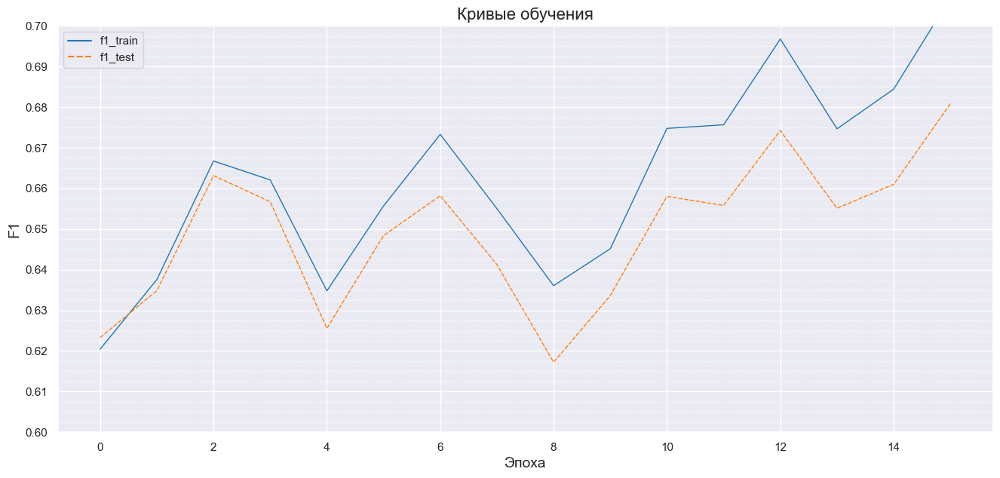

In [240]:
net_f1_stat_df = pd.DataFrame(test_stat[:, 1:3],
                              columns=['f1_train', 'f1_test']
                             )
learning_curve(net_f1_stat_df, [.6, .7])

Тестируем

In [241]:
MyNet_best.eval()
with torch.no_grad():
    net_test_probes = MyNet_best.forward(X_tst).flatten().detach().numpy()
    net_test_preds = np.rint(net_test_probes)

In [242]:
net_best_TESTmetrics = pd.DataFrame(
    data=[[f1_score(trgt_test.values, net_test_preds),
          accuracy_score(trgt_test.values, net_test_preds),
          precision_score(trgt_test.values, net_test_preds),
          recall_score(trgt_test.values, net_test_preds),
          roc_auc_score(trgt_test.values, net_test_probes)]],
    columns=['F1', 'Accuracy', 'Precision', 'Recall', 'AUC'],
    index=['MyNet_best_test']
)
net_best_TESTmetrics

,F1,Accuracy,Precision,Recall,AUC
MyNet_best_test,0.6778,0.6993,0.7336,0.6299,0.7694


Нейронная сеть протестирована на данных, обработанных классами `OneHotEncoder()` и `StandardScaler()`.

- Конфигурация сети (слой:число нейронов):     `1 :105`, `2 :64`, `3 :65`, `4 :32`, `5 :32`, `6 :16`, `7 :1`
- Выбраны параметры DropOut (слой:коэффициент):  `2 :.2`, `3:.2`, `4:.1`, `5 :.1`, `6 :0`
- Выбраны отимальный размер батча и темп обучения.

Собираем всю статистику вместе

In [232]:
all_stat = pd.concat([CBC_best_TESTmetrics_all_cat,
                      LGB_best_TESTmetrics,
                      net_best_TESTmetrics]
                    ).sort_values(by='F1', ascending=False)
display(all_stat)

,F1,Accuracy,Precision,Recall,AUC
MyNet_best_test,0.6778,0.6993,0.7336,0.6299,0.7694
CatBoost_tuned_(all_cat)_test,0.6708,0.7016,0.7518,0.6055,0.7670
LightGBM_tuned_test,0.6634,0.6993,0.7575,0.5901,0.7642


**Вывод:** Лучшая модель по метрике `F1` - нейронная сеть.

### Матрица ошибок, ROC-кривая лучшей модели

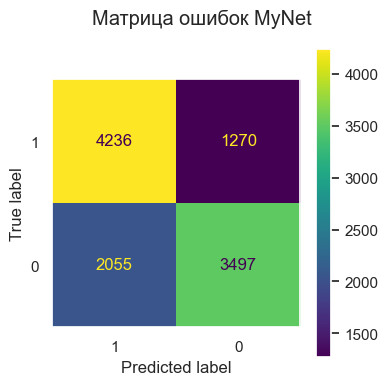

In [256]:
disp = ConfusionMatrixDisplay(
    confusion_matrix(trgt_test, net_test_preds),
    display_labels=[1, 0]
)
fig, ax = plt.subplots(figsize=(4, 4))
disp.plot(ax=ax)
fig.suptitle('Матрица ошибок MyNet')
ax.grid()
plt.show()

Построим `ROC кривую` для модели `MyNet`

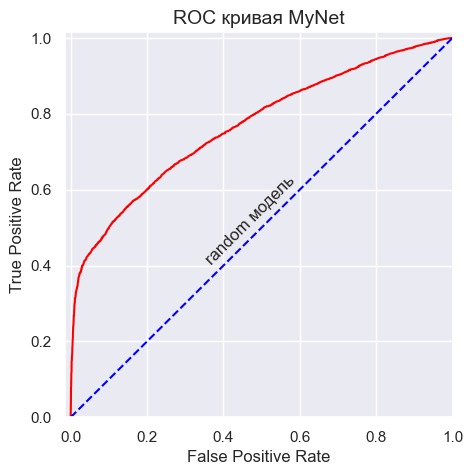

In [261]:
fpr, tpr, thresholds = roc_curve(trgt_test, net_test_probes)

fig, ax = plt.subplots(figsize=(5,5))

sns.lineplot(x=fpr[::3], y=tpr[::3], color='red')
sns.lineplot(x=[0, 1], y=[0, 1], color='blue', linestyle='--')

ax.text(0.47, 0.52, "random модель", rotation=45, size=12, ha="center", va="center")
ax.set_xlim([-0.015, 1])
ax.set_ylim([0, 1.015])
ax.set_title('ROC кривая MyNet', fontsize=14)
ax.set_xlabel('False Positive Rate', fontsize=12)
ax.set_ylabel('True Positive Rate', fontsize=12)

plt.show()

## Анализ важности факторов ДТП

Выведем важность признаков, базируясь на данных второй по рейтингу модели `CatBoostClassifier`

In [264]:
def plot_feature_importance(importance, fch_names, model_type):
    
    feature_importance = np.array(importance)
    feature_names = np.array(fch_names)
    
    data={'feature_names': feature_names, 'feature_importance': feature_importance}
    fch_df = pd.DataFrame(data)   
    fch_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)
    
    plt.figure(figsize=(7, 7))
    sns.barplot(x=fch_df['feature_importance'], y=fch_df['feature_names'])
    
    plt.title(model_type + ' Feature importance', fontsize=14)
    plt.xlabel('FEATURE IMPORTANCE')
    plt.ylabel('FEATURE NAMES')

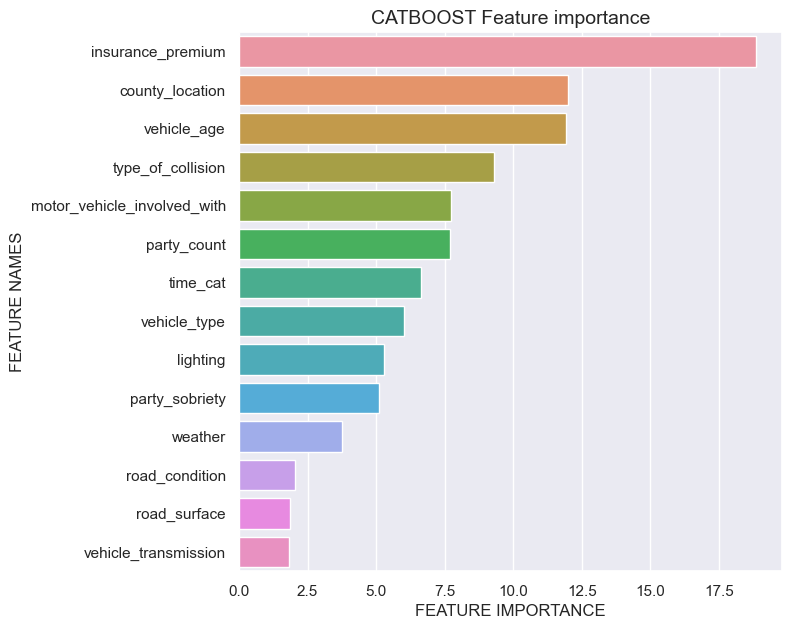

In [265]:
sns.set_theme(style='darkgrid')
plot_feature_importance(CBCModel_best.get_feature_importance(), fch_train_all_cat.columns,'CATBOOST')

1. Самым важным фактором прогноза виновности в ДТП является размер страховой премии `insurance_premium`
2. Вторым по важности факторов является локация `county_location`
3. Третьим - возраст автомобиля `vehicle_age`

Если говорить о мерах, которые можно предпринять для более точного прогнозирования виновника ДТП, то следовало бы выяснять условия страховки (например, размер франшизы) при заключении договора с клиентом каршеринга, проводить актуализацию этих данных через взаимодействие со страхововй компанией, добавить данные по стажу водителя, статистику предыдущих ДТП.

## Вывод

1. Лучшей моделью, способной сделать прогноз по отобранным признакам и по метрике `F1` оказалась нейронная сеть.
2. Создать более совершенную модель прогнозирования виновности водителя при ДТП возможно, для этого надо добавить  еще 2-3 сильных признака. Например: данные по стажу водителя, коэффициент "бонус-малус", размер франшизы. Вероятно, эти признаки помогли бы прогнозировать виновность водителя еще более точно.